In [ ]:
import numpy as np
import pandas as pd
from pprint import pprint
from scipy import stats

import matplotlib
matplotlib.use("Agg")
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.ticker import MultipleLocator
from matplotlib import rc, rcParams

rc("font", size=18.0)
rcParams["font.family"] = "serif"
rcParams["mathtext.fontset"] = "dejavuserif"
%matplotlib inline

In [ ]:
from sklearn.model_selection import train_test_split

from sklearn.ensemble import GradientBoostingRegressor

from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve

from sklearn.model_selection import RandomizedSearchCV

In [ ]:
# Function to read in the data and do some renaming of columns
def ReadData(observatory):
  if observatory == "IceCube":
    url = "https://raw.githubusercontent.com/bflaggs/CRMassMultivariateML/main/data/energy-corrected/IceCube_Condensed_AllParticles_AllEnergiesAndZeniths_EnergyCorrected.txt"
  elif observatory == "Auger":
    url = "https://raw.githubusercontent.com/bflaggs/CRMassMultivariateML/main/data/energy-corrected/Auger_Condensed_AllParticles_AllEnergiesAndZeniths_EnergyCorrected.txt"
  else:
    raise ValueError("Not possible for this observatory. Only 'IceCube' and 'Auger' are valid inputs.")

  df = pd.read_csv(url, sep=" ")

  # Rename some columns to make things easier for future...
  df.columns = ["ParticleID", "EnergyGeV", "zenith", "nEM_Xmax", "nEM_Obslev", "nEM800m_NOTCORRECTED", "nMuHighE", "R_eMuHighE", "nMu800m", "R_eMu800m", "Xmax", "SigmaXmax", "R", "SigmaR", "L", "SigmaL"]

  return df

In [ ]:
# Function to apply same data cuts as the Fisher analysis to the data
def ApplyFisherDataCuts(dataset, ProtonIron=False, HeliumOxygen=False, ProtonHelium=False):
  if ProtonIron + HeliumOxygen + ProtonHelium > 1:
    raise ValueError("Can only set one (or none) of the three keywords for mass comparison.")

  # Drop bad data, same cuts as my Fisher analysis
  dfCuts = dataset[(dataset.nMuHighE != -np.inf) &
                   (dataset.nMu800m != -np.inf) &
                   (dataset.R_eMu800m != -np.inf) &
                   (dataset.SigmaXmax != np.inf) &
                   (dataset.SigmaR != np.inf) &
                   (dataset.SigmaL != np.inf) &
                   (dataset.SigmaXmax < 5.0) &
                   (dataset.SigmaR < 0.05) &
                   (dataset.SigmaL < 5.0) &
                   (dataset.R > 0.0) &
                   (dataset.L < 350.0)]

  if ProtonIron == True:
    # Cut He and O
    dfCuts = dfCuts[(dfCuts.ParticleID != 402) &
                    (dfCuts.ParticleID != 1608)]
    # Convert p and Fe ParticlsIDs to binaries
    dfCuts.ParticleID[dfCuts.ParticleID == 5626] = 0
    dfCuts.ParticleID[dfCuts.ParticleID == 14] = 1
    plotLabels = ['Proton', 'Iron']
    plotColors = ['#CC6677', '#4477AA']

  elif HeliumOxygen == True:
    # Cut p and Fe
    dfCuts = dfCuts[(dfCuts.ParticleID != 14) &
                    (dfCuts.ParticleID != 5626)]
    # Convert He and O ParticlsIDs to binaries
    dfCuts.ParticleID[dfCuts.ParticleID == 1608] = 0
    dfCuts.ParticleID[dfCuts.ParticleID == 402] = 1
    plotLabels = ['Helium', 'Oxygen']
    plotColors = ['#DDCC77', '#117733']

  elif ProtonHelium == True:
    # Cut O and Fe
    dfCuts = dfCuts[(dfCuts.ParticleID != 1608) &
                    (dfCuts.ParticleID != 5626)]
    # Convert p and He ParticlsIDs to binaries
    dfCuts.ParticleID[dfCuts.ParticleID == 402] = 0
    dfCuts.ParticleID[dfCuts.ParticleID == 14] = 1
    plotLabels = ['Proton', 'Helium']
    plotColors = ['#CC6677', '#DDCC77']

  else:
    print("No keyword for separating two primary types. Instead will try separating protons from heavier primaries!")
    # Convert p and heavier ParticleIDs to binaries
    dfCuts.ParticleID[dfCuts.ParticleID != 14] = 0 # Must do this first!
    dfCuts.ParticleID[dfCuts.ParticleID == 14] = 1
    plotLabels = ['Proton', 'Heavier']
    plotColors = ['#CC6677', '#4477AA']

  return dfCuts, plotLabels, plotColors

In [ ]:
# Function to apply zenith angle cuts
def ApplyZenithCut(dataset, minZen=40.0, maxZen=60.0):
  dfZenCuts = dataset[((dataset.zenith * 180. / np.pi) >= minZen) &
                      ((dataset.zenith * 180. / np.pi) <= maxZen)]
  return dfZenCuts

In [ ]:
# Function to apply energy bin cuts, used to split data in energy so that multiple models can be trained
def BinByEnergy(dataset, minLgE=16.0, maxLgE=18.5):
  dfEnergyBinned = dataset[(np.log10(dataset.EnergyGeV * 1e+9) >= minLgE) &
                           (np.log10(dataset.EnergyGeV * 1e+9) <= maxLgE)]
  return dfEnergyBinned

In [ ]:
# Function to drop columns not used in Fisher analysis and separate array of particle labels (goal) from data
def GetDataForGBDT(dataset, observatory, dropZenith=False):
  if observatory == "IceCube":
    if dropZenith == True:
      dfGBDT = dataset.drop(columns=["EnergyGeV", "zenith", "nEM_Xmax", "nEM800m_NOTCORRECTED", "SigmaXmax", "SigmaR", "SigmaL"])
      smearLevels = [0.1, 0.07, 0.12, 0.1, 0.14, 20.0, 0.05, 5.0]
    else:
      dfGBDT = dataset.drop(columns=["EnergyGeV", "nEM_Xmax", "nEM800m_NOTCORRECTED", "SigmaXmax", "SigmaR", "SigmaL"])
      smearLevels = [2.0 * np.pi / 180.0, 0.1, 0.07, 0.12, 0.1, 0.14, 20.0, 0.05, 5.0]

  elif observatory == "Auger":
    if dropZenith == True:
      dfGBDT = dataset.drop(columns=["EnergyGeV", "zenith", "nEM_Xmax", "nEM800m_NOTCORRECTED", "nMuHighE", "R_eMuHighE", "SigmaXmax", "SigmaR", "SigmaL"])
      smearLevels = [0.1, 0.1, 0.14, 20.0, 0.05, 5.0]
    else:
      dfGBDT = dataset.drop(columns=["EnergyGeV", "nEM_Xmax", "nEM800m_NOTCORRECTED", "nMuHighE", "R_eMuHighE", "SigmaXmax", "SigmaR", "SigmaL"])
      smearLevels = [2.0 * np.pi / 180.0, 0.1, 0.1, 0.14, 20.0, 0.05, 5.0]

  else:
    raise ValueError("Not possible for this observatory. Only 'IceCube' and 'Auger' are valid inputs.")

  # Define another array which contains the labels of the particles
  particleIDs = np.array(dfGBDT["ParticleID"])

  # Remove the IDs for the particles from the dataset, so that model can be trained
  dfGBDT.drop(columns=["ParticleID"], inplace=True)

  return dfGBDT, particleIDs, smearLevels

In [ ]:
# Function to get the feature importances and print them nicely to the screen
def PrintFeatureImportances(importance_list, feature_list):
  if type(feature_list) != list:
    feature_list = list(feature_list)

  ft_importances = [(feature, round(importance, 3)) for feature, importance in zip(feature_list, importance_list)]
  ft_importances = sorted(ft_importances, key = lambda x:x[1], reverse=True)
  [print("Observable: {:20} Importance: {}".format(*pair)) for pair in ft_importances]

In [ ]:
# Function to smear data (used to simulate detector response, i.e. true reconstructions)
def SmearData(original_array, smear_values):
  if len(smear_values) != original_array.shape[1]:
    raise ValueError("Shape of smearing array values and data to smear is not the same!")

  smeared_array = np.copy(original_array)

  for i in range(original_array.shape[0]):
    for j in range(original_array.shape[1]):
      smeared_array[i][j] += stats.norm.rvs(loc=0.0, scale=smear_values[j])

  return smeared_array

In [ ]:
# Function to extract FOM value
def GetFOM(GBDT, testData, testIDs, plotLabels, smearValues=False, smearArray=None, printOutput=False):
  if smearValues == True:
    testData_smeared = SmearData(testData, smearArray)
    gbdt_pred_test = GBDT.predict(testData_smeared)
  else:
    gbdt_pred_test = GBDT.predict(testData)

  pop1_gbdt_pred = gbdt_pred_test[np.nonzero(testIDs == 1)]
  pop2_gbdt_pred = gbdt_pred_test[np.nonzero(testIDs == 0)]

  reverseSorted_pop2 = np.sort(pop2_gbdt_pred)[::-1]
  pop2_5perOverlap = reverseSorted_pop2[:int(len(pop2_gbdt_pred)* 0.05)]
  pop1_5perContamination = pop1_gbdt_pred[np.nonzero(pop1_gbdt_pred > pop2_5perOverlap[-1])]

  pop2_1perOverlap = reverseSorted_pop2[:int(len(pop2_gbdt_pred)* 0.01)]
  pop1_1perContamination = pop1_gbdt_pred[np.nonzero(pop1_gbdt_pred > pop2_1perOverlap[-1])]

  frac_sep_pop1_5perContamination = len(pop1_5perContamination) / len(pop1_gbdt_pred)
  frac_sep_pop1_1perContamination = len(pop1_1perContamination) / len(pop1_gbdt_pred)

  mean_pop1 = np.mean(pop1_gbdt_pred)
  mean_pop2 = np.mean(pop2_gbdt_pred)
  std_pop1 = np.std(pop1_gbdt_pred)
  std_pop2 = np.std(pop2_gbdt_pred)

  fom_gbdt = np.abs(mean_pop1 - mean_pop2) / np.sqrt(std_pop1**2 + std_pop2**2)

  if printOutput == True:
    if smearValues == True:
      print("For smeared values...")
    else:
      print("For true values...")

    print(f"    The GBDT FOM between {plotLabels[0]} and {plotLabels[1]} is: {fom_gbdt:.3f}")
    print(f"    The separable fraction of {plotLabels[0]} with 5% contamination from {plotLabels[1]} is: {frac_sep_pop1_5perContamination:.3f}")
    print(f"    The separable fraction of {plotLabels[0]} with 1% contamination from {plotLabels[1]} is: {frac_sep_pop1_1perContamination:.3f}")

  return fom_gbdt, frac_sep_pop1_5perContamination, frac_sep_pop1_1perContamination, pop1_gbdt_pred, pop2_gbdt_pred

In [ ]:
###### Make function here that trains a GBDT (w/ option for training on smeared or true)
###### and then loops through the test sets (w/ diff smear or true option) and
###### then calculates the FOM and separation for each energy bin that the test
###### set can be split into (should be in bin widths of 0.2 in lgE). Can then
###### go ahead and have another function which makes the histogram for these
###### binned values......

###### New histogram fucntion should be generalized to the point where it only
###### takes in the test populations data set run through the ML algorithm and
###### then can calculate the FOM and contamination factors individually
###### Maybe then it would be best to have a function that just runs the populations
###### through the ML algorithm then returns the result...

In [ ]:
# Function that does the above... (histograms)
#def GeneralizedHistogram(pop1, pop2):

In [ ]:
# Function to make the output histogram
def MakeHistogram(observatory, pop1_pred, pop2_pred, fom, cont_5per, cont_1per, plotLabels, plotColors, lgEbins=[16.0,18.5], smearValues=False, smearArray=None):

  plt.figure(figsize=(18.0 / 2.54, 15.0 / 2.54))
  n2, bins2, patches2 = plt.hist(pop2_pred, bins=100, histtype="step", color=plotColors[1], label=plotLabels[1])
  n1, bins1, patches1 = plt.hist(pop1_pred, bins=100, histtype="step", color=plotColors[0], label=plotLabels[0])

  if max(n2) > max(n1):
    max_counts = max(n2)
  else:
    max_counts = max(n1)

  if plotLabels[0] == "Proton":
    sep_pop_string = "p"
  elif plotLabels[0] == "Helium":
    sep_pop_string = "He"

  reverseSorted_pop2 = np.sort(pop2_pred)[::-1]
  pop2_5perOverlap = reverseSorted_pop2[:int(len(pop2_pred)* 0.05)]
  pop2_1perOverlap = reverseSorted_pop2[:int(len(pop2_pred)* 0.01)]

  plt.vlines(pop2_5perOverlap[-1], 0, (max_counts / 3), colors="black", linestyle="dashed", label="5% Contamination")
  plt.vlines(pop2_1perOverlap[-1], 0, (max_counts / 3), colors="black", linestyle="dotted", label="1% Contamination")
  plt.text(0.1, (max_counts / 2), f"Frac. Sep. {sep_pop_string} = {cont_5per:.3f} @ 5% cont.", fontsize=12)
  plt.text(0.1, (max_counts / 2.2), f"Frac. Sep. {sep_pop_string} = {cont_1per:.3f} @ 1% cont.", fontsize=12)
  plt.text(0.05, (max_counts / 1.5), f"{observatory} (FOM = {fom:.2f})")
  plt.legend(loc="best", fontsize=14)
  if smearValues == True:
    plt.xlabel("GBT Regressor Output (Smeared)")
  else:
    plt.xlabel("GBT Regressor Output (True)")
  plt.ylabel("Counts")
  plt.title(f"lg(E / eV) = {lgEbins[0]:.1f}-{lgEbins[1]:.1f}")
  plt.show()


In [ ]:
# Setup another function which will be used to initialize the GBDT w/ a keyword option for setting up a smeared GBDT or not.
def SetupGBDT(og_df, observatory, primaries, smearedGBDT=False, analyzeModel=True, analyzeForSmearedTestData=False):

  print(f"Model trained to separate {primaries[0]} from {primaries[1]}.")

  # Define another array which contains the labels of the particles
  objectives = np.array(og_df["ParticleID"])

  # First do the train-test split of the data
  trainData, testData, trainObjectives, testObjectives = train_test_split(og_df.values, objectives, test_size=0.2, shuffle=True, random_state=42)

  # Now need to convert arrays to DataFrames and drop non-used things in analysis
  df_train = pd.DataFrame(trainData, columns=list(og_df.columns))
  df_test = pd.DataFrame(testData, columns=list(og_df.columns))

  df_train, train_obj, smearLevels = GetDataForGBDT(df_train, observatory, dropZenith=True)
  df_test, test_obj, smearLevels = GetDataForGBDT(df_test, observatory, dropZenith=True)

  if (trainObjectives != train_obj).any() or (testObjectives != test_obj).any():
    raise ValueError("Inconsistent objectives for train/test sets in train-test splitting and data cuts phases.")

  train_array = df_train.to_numpy()
  test_array = df_test.to_numpy()

  if smearedGBDT == True:
    print("Training the GBDT on smeared data to simulate detector resolutions...")
    train_array = SmearData(train_array, smearLevels)

  gbt_model = GradientBoostingRegressor(n_estimators=100, max_depth=3, random_state=0)
  print("Training the model...")
  gbt_model.fit(train_array, trainObjectives)

  if analyzeModel == True:
    AnalyzeGBDT(observatory, gbt_model, train_array, trainObjectives, pd.DataFrame(testData, columns=list(og_df.columns)), smearedModel=smearedGBDT, smearTestData=analyzeForSmearedTestData)

  if smearedGBDT == True:
    print("\n")
    print("WARNING: Returned train and test data frames will not be smeared! (But returned training array will be.)")

  return gbt_model, pd.DataFrame(trainData, columns=list(og_df.columns)), pd.DataFrame(testData, columns=list(og_df.columns)), smearLevels, train_array, trainObjectives

In [ ]:
# Function to analyze the GBDT, i.e. output model scores and list feature importances
def AnalyzeGBDT(observatory, trained_model, trainingData, trainingObjectives, original_testData_df, smearedModel=False, smearTestData=False):

  df_testdata, testingObjectives, smearLevels = GetDataForGBDT(original_testData_df, observatory, dropZenith=True)
  testingData = df_testdata.to_numpy()

  if smearTestData == True:
    testingData = SmearData(testingData, smearLevels)

  train_score = trained_model.score(trainingData, trainingObjectives)
  test_score = trained_model.score(testingData, testingObjectives)

  print(f"The scores of the GBT Regressor: {train_score:.4f} (training set), {test_score:.4f} (testing set)")

  if smearedModel == True and smearTestData == True:
    print("(model trained and tested on smeared data)")
  elif smearedModel == True and smearTestData == False:
    print("(model trained on smeared data but tested on exact knowledge data)")
  elif smearedModel == False and smearTestData == True:
    print("(model trained on exact knowledge data but tested on smeared data)")
  else:
    print("(model trained and tested on exact knowledge data)")

  print("Calculating model feature importances...")
  PrintFeatureImportances(list(trained_model.feature_importances_), list(df_testdata.columns))



In [ ]:
# In above function, remove the part where I smear both train and test data and instead also return the train_array and trainObjectives (maybe instead of the pandas traindata df)
# Also, take out where I calculate the scores and importances and place this in a new function called "AnalyzeGBDT" or something like this
# Then in one of the other functions below, I can actually add in that the test_data can be smeared and so now we can calculate FOMs from true train but smeared test data (and vice-versa)
# Will need to also save the two different populations output from the predictions of the GBDT, will then use these in a more general histogram function

In [ ]:
# Function to calculate a list of FOM values in different energy bins based on the energy binned test data
def FOMComparisonToFisher(observatory, trained_gbt, df_test_data, lgEBinEdges, plotLabels, plotColors, smearing=False, smearLevels=None, printVals=False, makeHistograms=False):
  FOM_list = []
  Contamination_5per = []
  Contamination_1per = []
  events_per_lgEbin = []

  for i in range(1, len(lgEBinEdges)):

    lgEBinned_test_data = df_test_data[(np.log10(df_test_data.EnergyGeV * 1e+9) >= lgEBinEdges[i-1]) &
                                      (np.log10(df_test_data.EnergyGeV * 1e+9) <= lgEBinEdges[i])]
    lgEBinned_test_IDs = np.array(lgEBinned_test_data["ParticleID"])

    if observatory == "IceCube":
      lgEBinned_test_data = lgEBinned_test_data.drop(columns=["ParticleID", "EnergyGeV", "zenith", "nEM_Xmax", "nEM800m_NOTCORRECTED", "SigmaXmax", "SigmaR", "SigmaL"])
    elif observatory == "Auger":
      lgEBinned_test_data = lgEBinned_test_data.drop(columns=["ParticleID", "EnergyGeV", "zenith", "nEM_Xmax", "nEM800m_NOTCORRECTED", "nMuHighE", "R_eMuHighE", "SigmaXmax", "SigmaR", "SigmaL"])
    else:
      raise ValueError("Observatory must be set to 'IceCube' or 'Auger'.")

    if printVals == True:
      print(f"For test data between lgE = {lgEBinEdges[i-1]:.1f} - {lgEBinEdges[i]:.1f} ({len(lgEBinned_test_IDs)} total events)")

    fom, cont_5per, cont_1per, pop1_pred, pop2_pred = GetFOM(trained_gbt, lgEBinned_test_data.values, lgEBinned_test_IDs, plotLabels, smearValues=smearing, smearArray=smearLevels, printOutput=printVals)

    if makeHistograms == True:
      MakeHistogram(observatory, pop1_pred, pop2_pred, fom, cont_5per, cont_1per, plotLabels, plotColors, lgEbins=[lgEBinEdges[i-1],lgEBinEdges[i]], smearValues=smearing, smearArray=smearLevels)

    FOM_list.append(fom)
    Contamination_5per.append(cont_5per)
    Contamination_1per.append(cont_1per)
    events_per_lgEbin.append(len(lgEBinned_test_IDs))

  return FOM_list, Contamination_5per, Contamination_1per, events_per_lgEbin

In [ ]:
# Function that does whole analysis that take the observatory, energy bins, and primary type as input
def PerformGBTAnalysis(observatory, lgEbinsFOM, pFe=False, HeO=False, pHe=False, smear=False, verbose=False):
  dataframe = ReadData(observatory)
  dataframe, plotLabels, plotColors = ApplyFisherDataCuts(dataframe, ProtonIron=pFe, HeliumOxygen=HeO, ProtonHelium=pHe)
  print("\n")

  dataframe_zenCut = ApplyZenithCut(dataframe, minZen=40., maxZen=60.) # Apply zenith cut same as Fisher analysis
  dataframe_ECut = BinByEnergy(dataframe_zenCut, minLgE=16.0, maxLgE=18.5) # Apply energy cut same as Fisher analysis

  gbtReg, df_train, df_test, smearLevels, _junkarray, _junkobjectives = SetupGBDT(dataframe_ECut, observatory, plotLabels, smearedGBDT=smear, analyzeModel=True, analyzeForSmearedTestData=True)

  FOMs, contam_5per, contam_1per, events_per_bin = FOMComparisonToFisher(observatory, gbtReg, df_test, lgEbinsFOM, plotLabels, plotColors,
                                                                         smearing=smear, smearLevels=smearLevels, printVals=verbose, makeHistograms=True)

  return FOMs, contam_5per, contam_1per, events_per_bin

In [ ]:
ic_df = ReadData("IceCube")

In [ ]:
ic_df, plotLabels, plotColors = ApplyFisherDataCuts(ic_df, ProtonIron=True, HeliumOxygen=False, ProtonHelium=False)

<ipython-input-35-322124611bc6>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfCuts.ParticleID[dfCuts.ParticleID == 14] = 1


In [ ]:
ic_df_zenCut = ApplyZenithCut(ic_df, minZen=40., maxZen=60.) # Apply zenith cut same as Fisher analysis

In [ ]:
ic_df_ECut = BinByEnergy(ic_df_zenCut, minLgE=16.0, maxLgE=18.5) # Apply energy cut same as Fisher analysis

In [ ]:
#gbtReg, df_train, df_test, junk = SetupGBDT(ic_df_ECut, "IceCube", plotLabels, smearValues=False)

In [ ]:
#gbtReg_smear, df_train_smear, df_test_smear, ic_smearLevels = SetupGBDT(ic_df_ECut, "IceCube", plotLabels, smearValues=True)

In [ ]:
#lgEBinEdges = [16.0, 16.2, 16.4, 16.6, 16.8, 17.0, 17.2, 17.4, 17.6, 17.8, 18.0, 18.2, 18.4]

In [ ]:
#pFe_FOMs_true, pFe_5per_true, pFe_1per_true, pFe_events_true = FOMComparisonToFisher("IceCube", gbtReg, df_test, lgEBinEdges, plotLabels,
#                                                                                      smearing=False, smearLevels=None, printVals=False)

In [ ]:
#pFe_FOMs_smeared, pFe_5per_smeared, pFe_1per_smeared, pFe_events_smeared = FOMComparisonToFisher("IceCube", gbtReg_smear, df_test_smear, lgEBinEdges, plotLabels,
#                                                                                                 smearing=True, smearLevels=ic_smearLevels, printVals=False)

In [ ]:
#pFe_FOMs_true, pFe_FOMs_smeared

In [ ]:
# Function to print output from GBDT analysis in a clear concise way
def PrintGBTResults(lgEbins, foms, cut_5per, cut_1per, num_events):

  lgEbins_centers = []
  for i in range(1, len(lgEbins)):
    cent = (lgEbins[i-1] + lgEbins[i]) / 2
    cent = round(cent, 1)
    lgEbins_centers.append(cent)

  eng_binned_output = [(lgE, fom, cut5, cut1, round(events, 0)) for lgE, fom, cut5, cut1, events in zip(lgEbins_centers, foms, cut_5per, cut_1per, num_events)]
  eng_binned_output = sorted(eng_binned_output, key = lambda x:x[0], reverse=False)
  print("\n")
  print("lgE Bin (Center),   FOM,                5% Contamination,   1% Contamination,   # Events")
  [print("{:<20.1f} {:<20.2f} {:<20.3f} {:<20.3f} {:<20}".format(*bin_output)) for bin_output in eng_binned_output]

In [ ]:
lgEBinEdges = [16.0, 16.2, 16.4, 16.6, 16.8, 17.0, 17.2, 17.4, 17.6, 17.8, 18.0, 18.2, 18.4]

# IceCube (p Fe Separation)

<ipython-input-35-322124611bc6>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfCuts.ParticleID[dfCuts.ParticleID == 14] = 1




Model trained to separate Proton from Iron.
Training the model...
The scores of the GBT Regressor: 0.9637 (training set), 0.6299 (testing set)
(model trained on exact knowledge data but tested on smeared data)
Calculating model feature importances...
Observable: nMuHighE             Importance: 0.935
Observable: nMu800m              Importance: 0.04
Observable: nEM_Obslev           Importance: 0.012
Observable: Xmax                 Importance: 0.005
Observable: L                    Importance: 0.004
Observable: R_eMuHighE           Importance: 0.002
Observable: R_eMu800m            Importance: 0.001
Observable: R                    Importance: 0.001


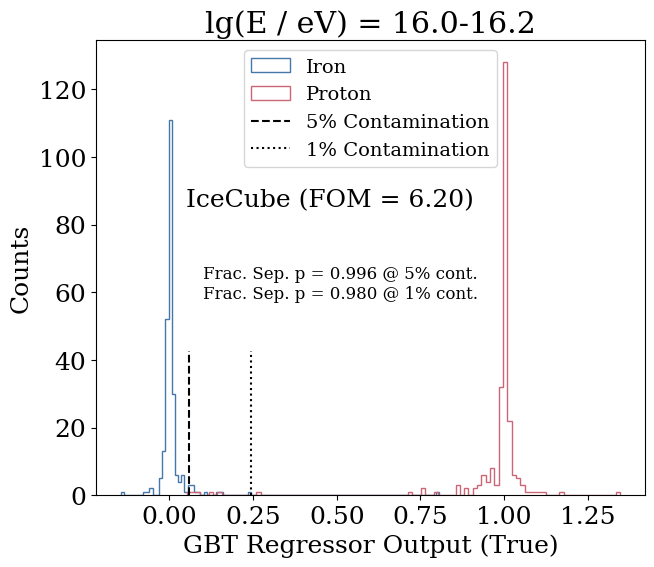

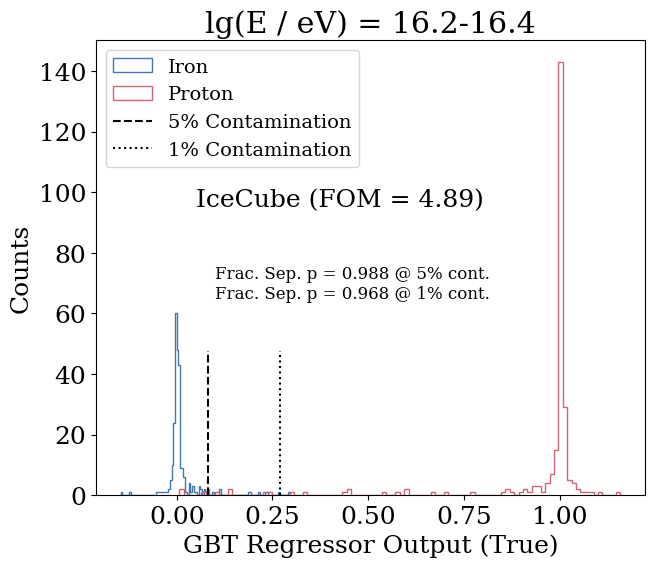

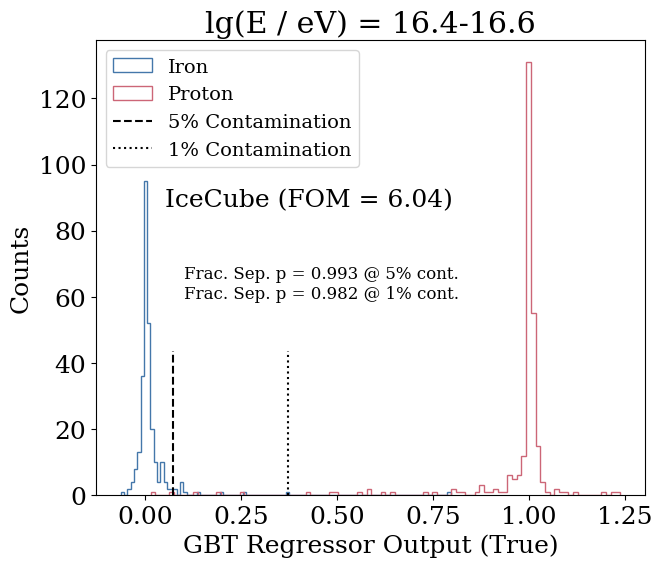

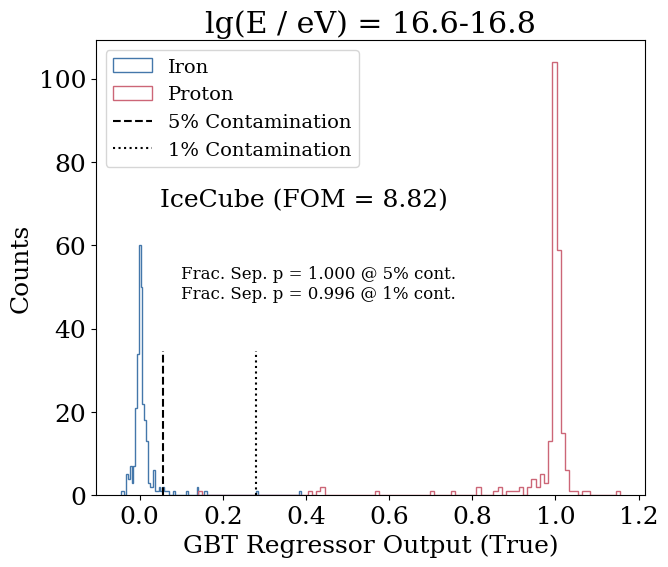

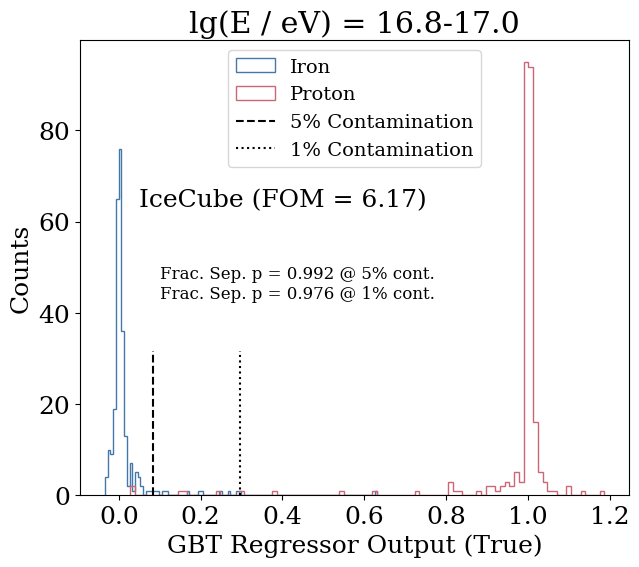

...

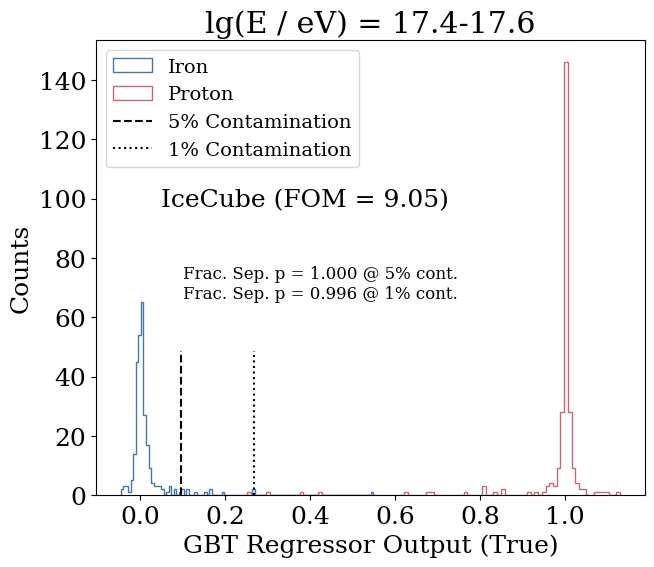

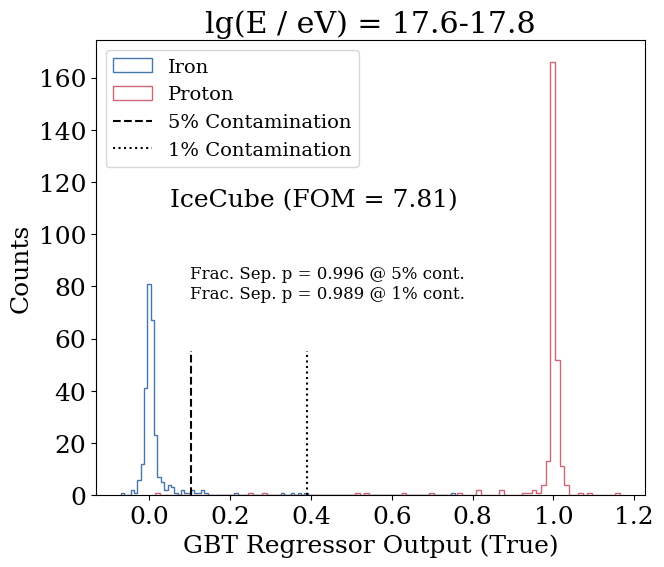

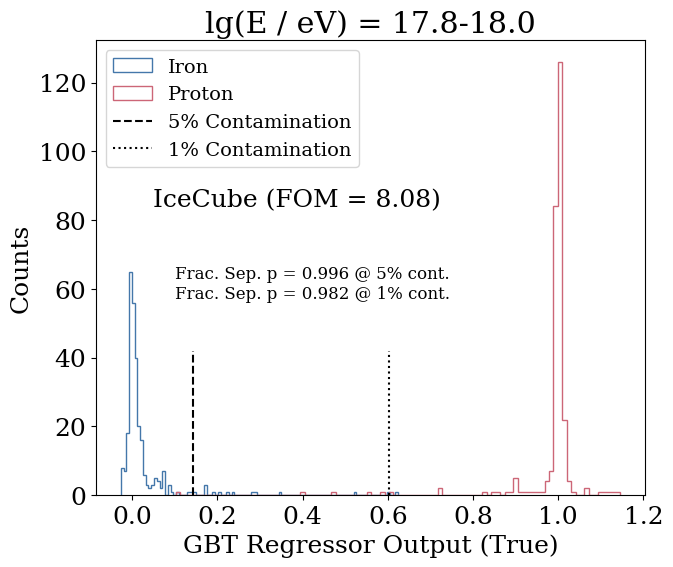

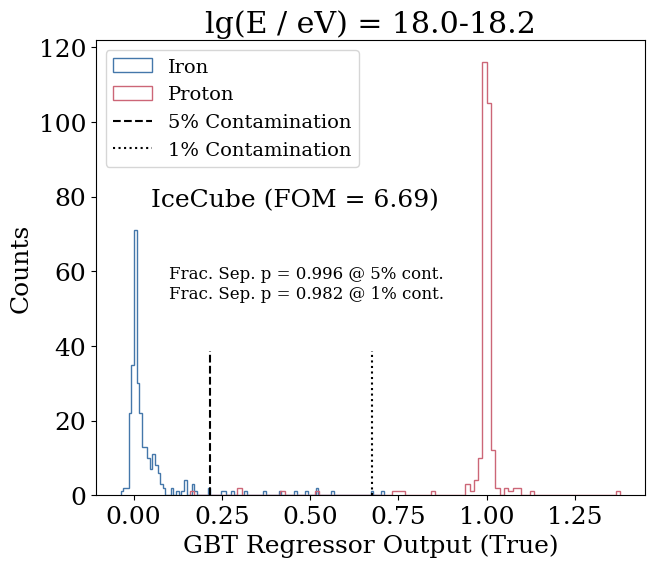

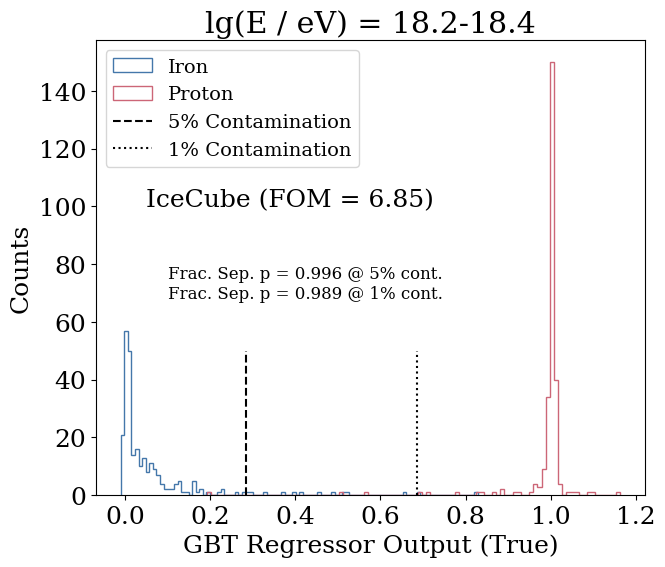



lgE Bin (Center),   FOM,                5% Contamination,   1% Contamination,   # Events
16.1                 6.20                 0.996                0.980                490                 
16.3                 4.89                 0.988                0.968                505                 
16.5                 6.04                 0.993                0.982                547                 
16.7                 8.82                 1.000                0.996                513                 
16.9                 6.17                 0.992                0.976                523                 
17.1                 6.50                 0.992                0.980                510                 
17.3                 6.92                 1.000                0.993                551                 
17.5                 9.05                 1.000                0.996                539                 
17.7                 7.81                 0.996                0.989 

In [ ]:
ic_pFe_FOM_true, ic_pFe_5per_true, ic_pFe_1per_true, ic_pFe_numEvents_true = PerformGBTAnalysis("IceCube", lgEBinEdges, pFe=True, HeO=False, pHe=False, smear=False, verbose=False)
PrintGBTResults(lgEBinEdges, ic_pFe_FOM_true, ic_pFe_5per_true, ic_pFe_1per_true, ic_pFe_numEvents_true)

<ipython-input-35-322124611bc6>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfCuts.ParticleID[dfCuts.ParticleID == 14] = 1




Model trained to separate Proton from Iron.
Training the GBDT on smeared data to simulate detector resolutions...
Training the model...
The scores of the GBT Regressor: 0.8301 (training set), 0.8292 (testing set)
(model trained and tested on smeared data)
Calculating model feature importances...
Observable: nMuHighE             Importance: 0.852
Observable: Xmax                 Importance: 0.092
Observable: nMu800m              Importance: 0.034
Observable: nEM_Obslev           Importance: 0.01
Observable: L                    Importance: 0.005
Observable: R                    Importance: 0.003
Observable: R_eMuHighE           Importance: 0.002
Observable: R_eMu800m            Importance: 0.001




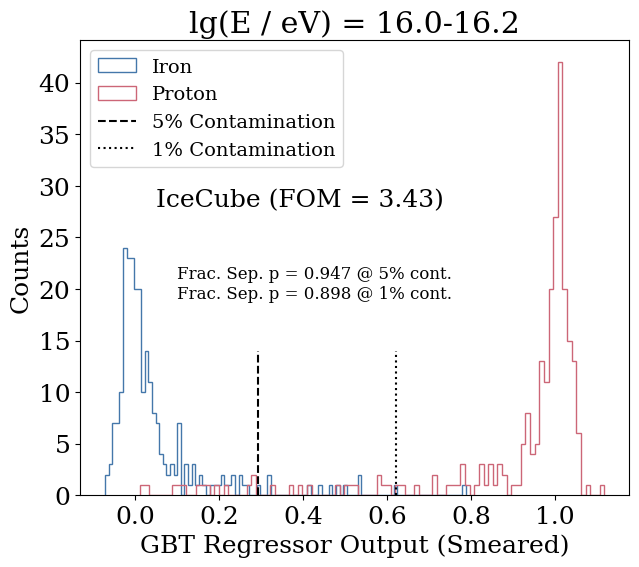

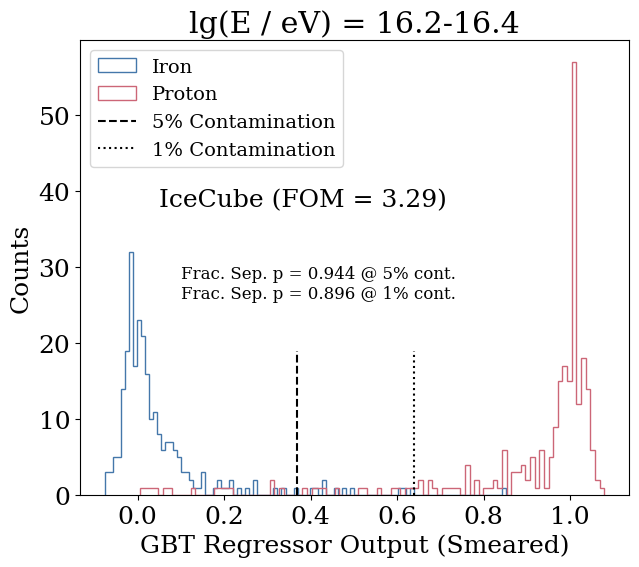

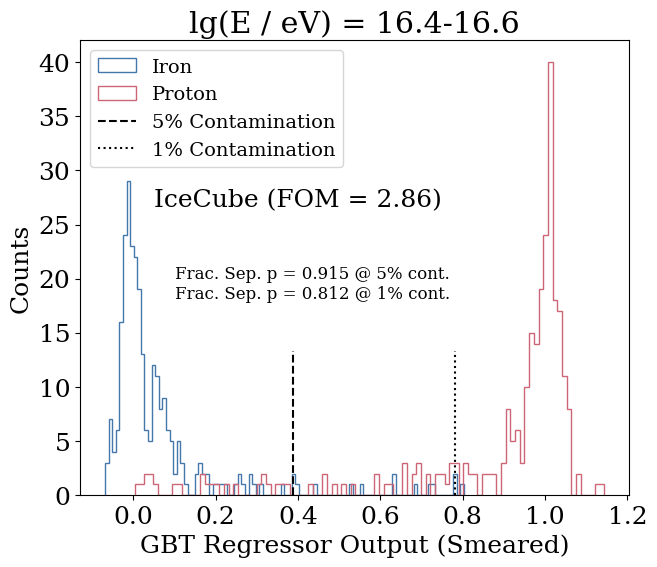

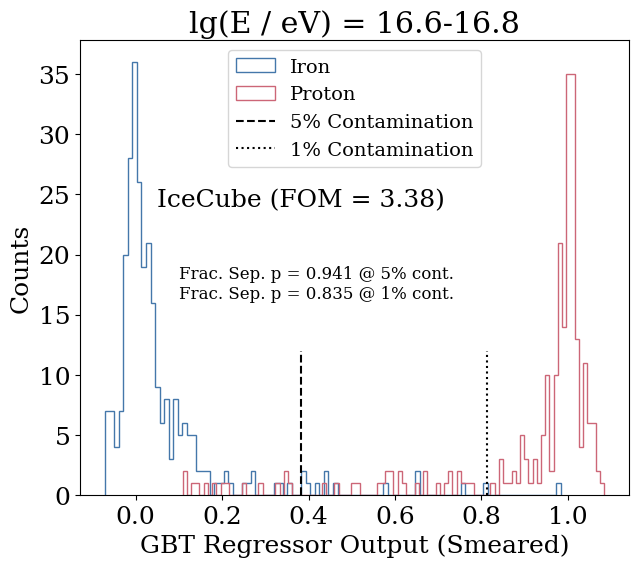

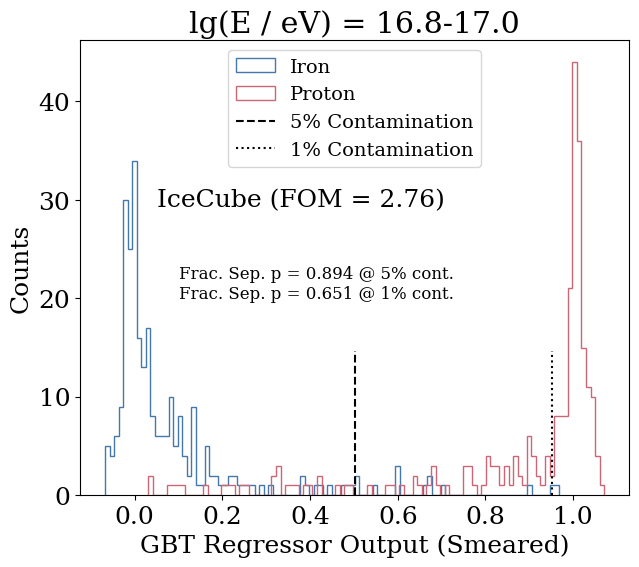

...

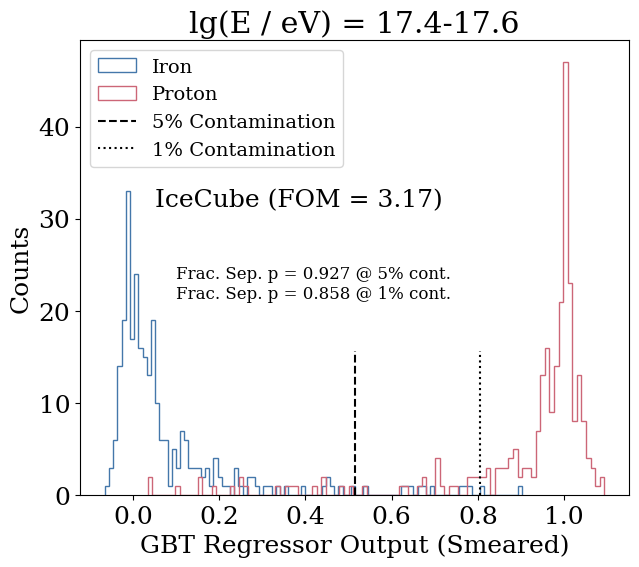

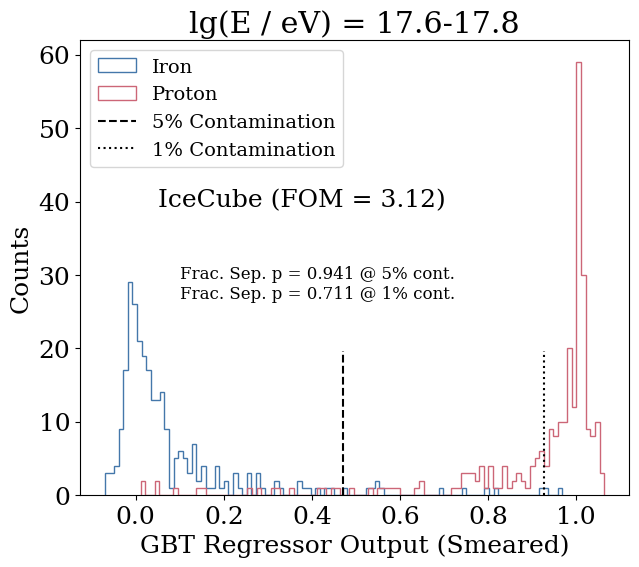

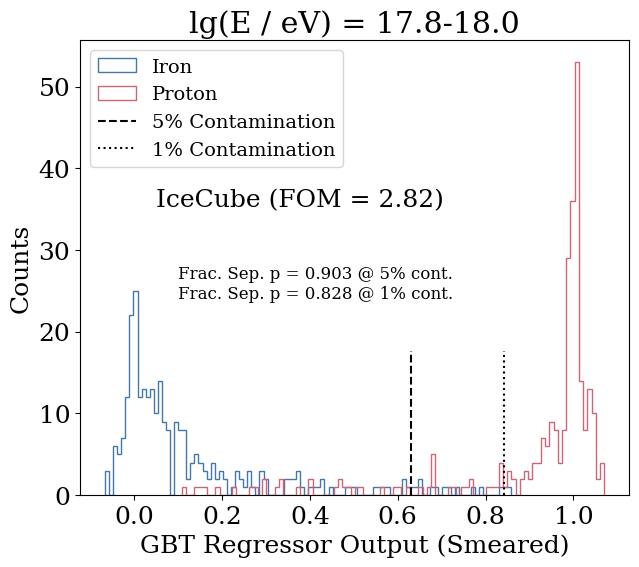

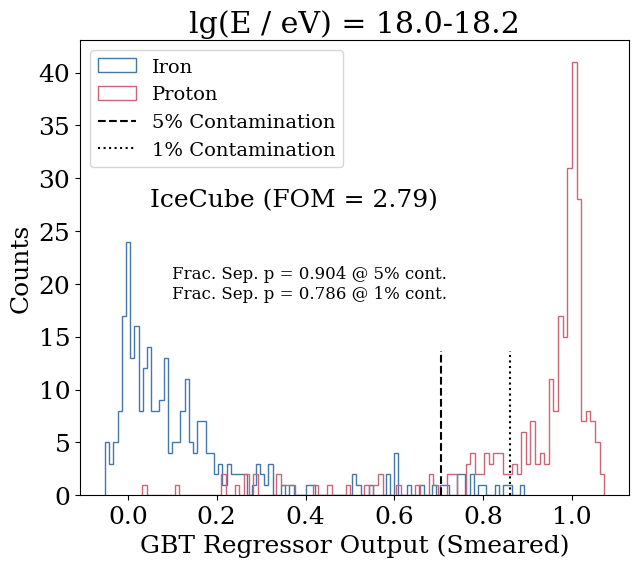

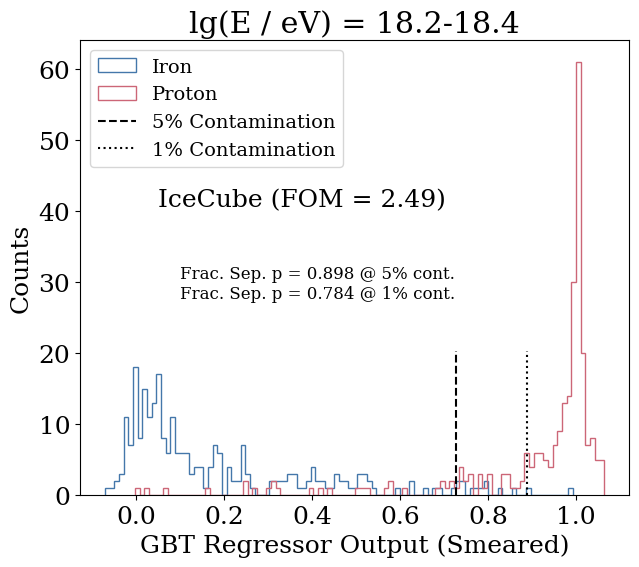



lgE Bin (Center),   FOM,                5% Contamination,   1% Contamination,   # Events
16.1                 3.43                 0.947                0.898                490                 
16.3                 3.29                 0.944                0.896                505                 
16.5                 2.86                 0.915                0.812                547                 
16.7                 3.38                 0.941                0.835                513                 
16.9                 2.76                 0.894                0.651                523                 
17.1                 3.06                 0.934                0.877                510                 
17.3                 2.95                 0.902                0.847                551                 
17.5                 3.17                 0.927                0.858                539                 
17.7                 3.12                 0.941                0.711 

In [ ]:
ic_pFe_FOM_smear, ic_pFe_5per_smear, ic_pFe_1per_smear, ic_pFe_numEvents_smear = PerformGBTAnalysis("IceCube", lgEBinEdges, pFe=True, HeO=False, pHe=False, smear=True, verbose=False)
PrintGBTResults(lgEBinEdges, ic_pFe_FOM_smear, ic_pFe_5per_smear, ic_pFe_1per_smear, ic_pFe_numEvents_smear)

# IceCube (He O Separation)

<ipython-input-35-322124611bc6>:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfCuts.ParticleID[dfCuts.ParticleID == 402] = 1




Model trained to separate Helium from Oxygen.
Training the model...
The scores of the GBT Regressor: 0.5073 (training set), 0.1218 (testing set)
(model trained on exact knowledge data but tested on smeared data)
Calculating model feature importances...
Observable: nMuHighE             Importance: 0.668
Observable: nMu800m              Importance: 0.217
Observable: L                    Importance: 0.053
Observable: Xmax                 Importance: 0.022
Observable: nEM_Obslev           Importance: 0.016
Observable: R                    Importance: 0.013
Observable: R_eMu800m            Importance: 0.01
Observable: R_eMuHighE           Importance: 0.002


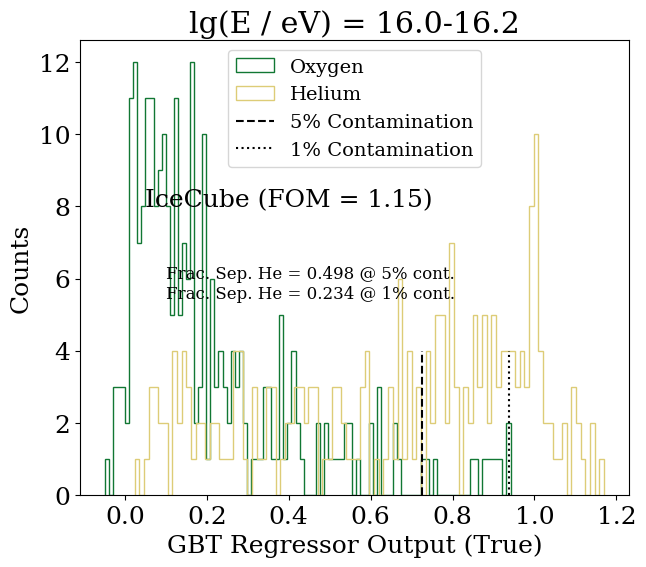

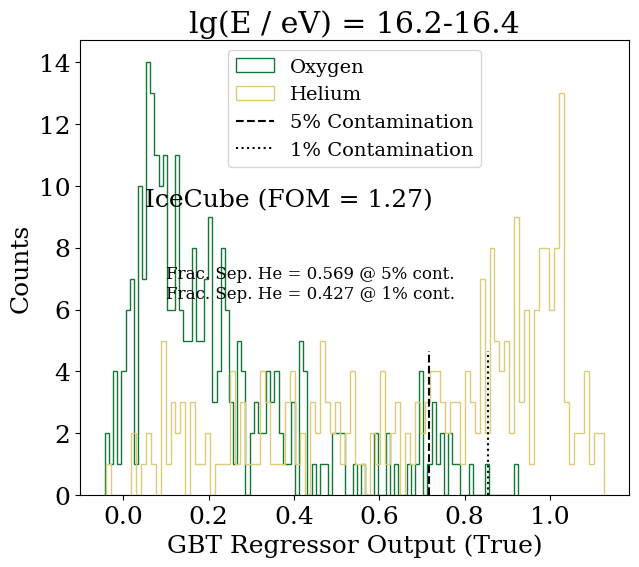

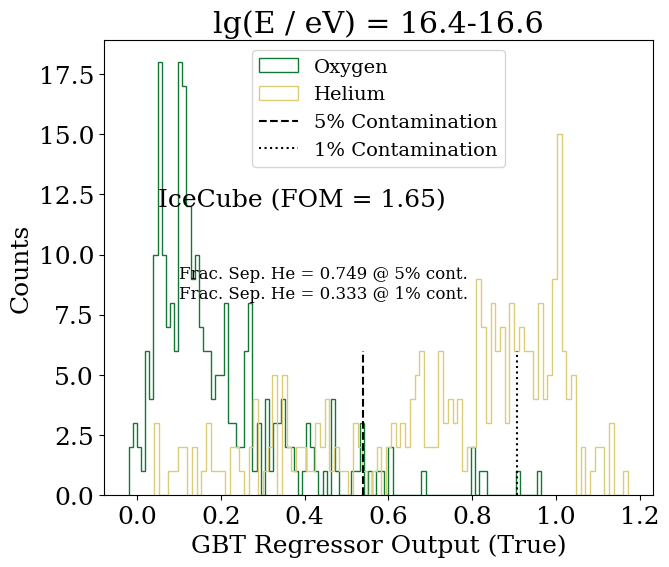

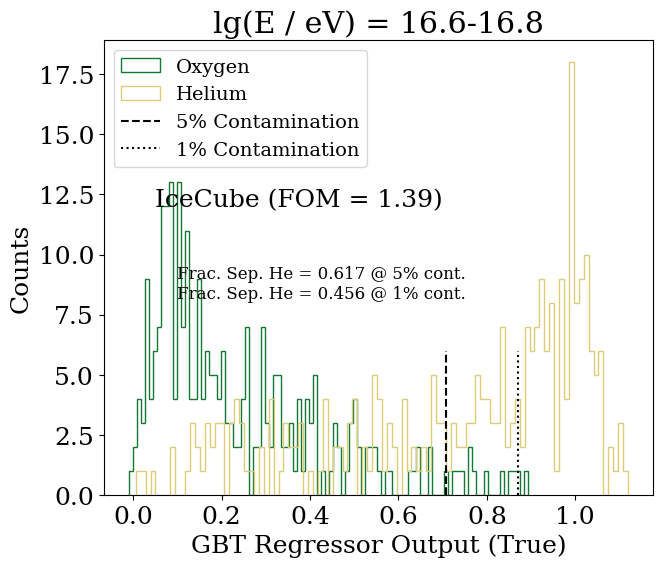

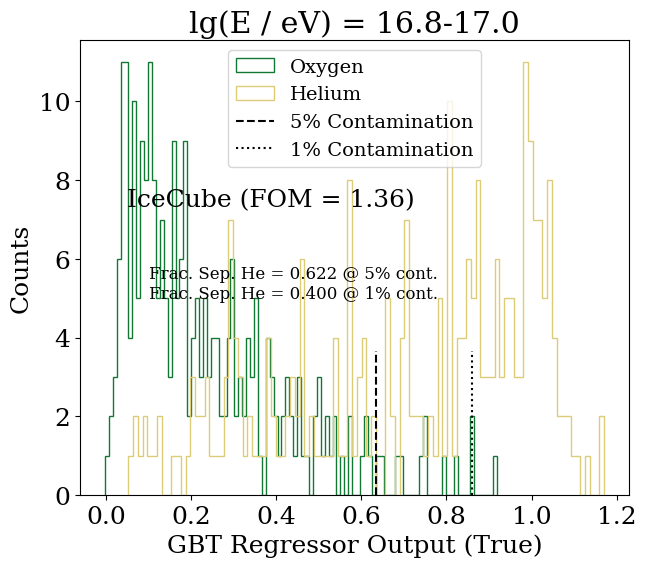

...

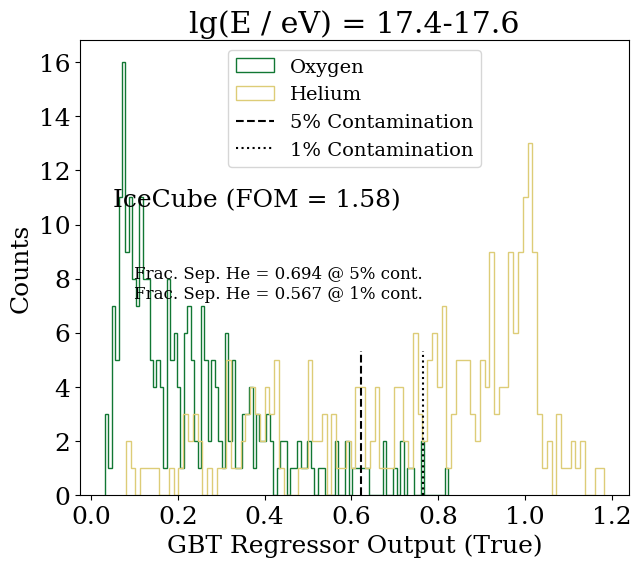

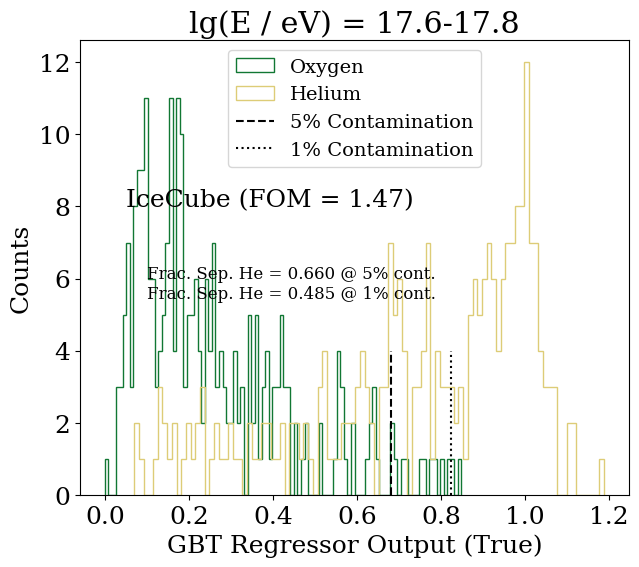

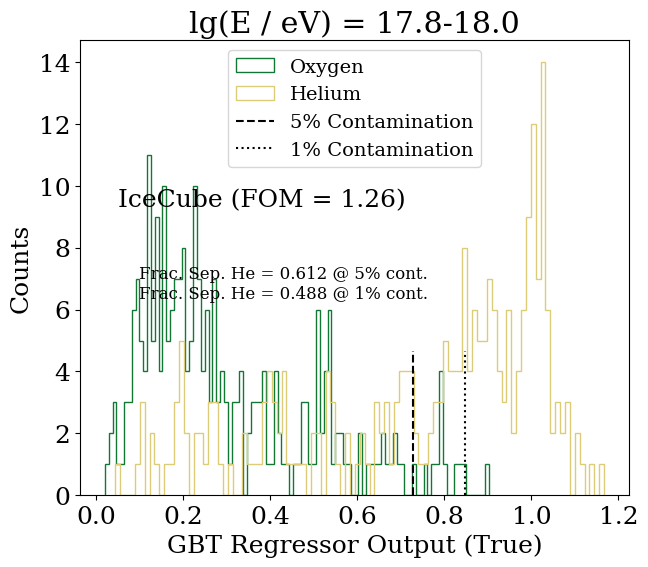

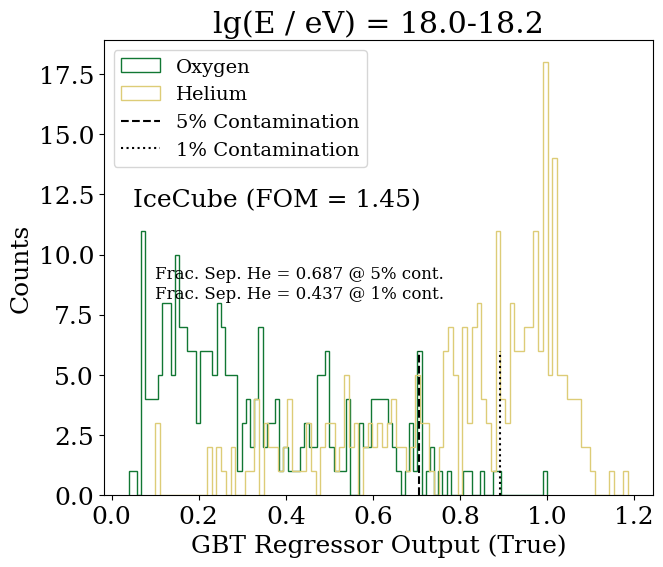

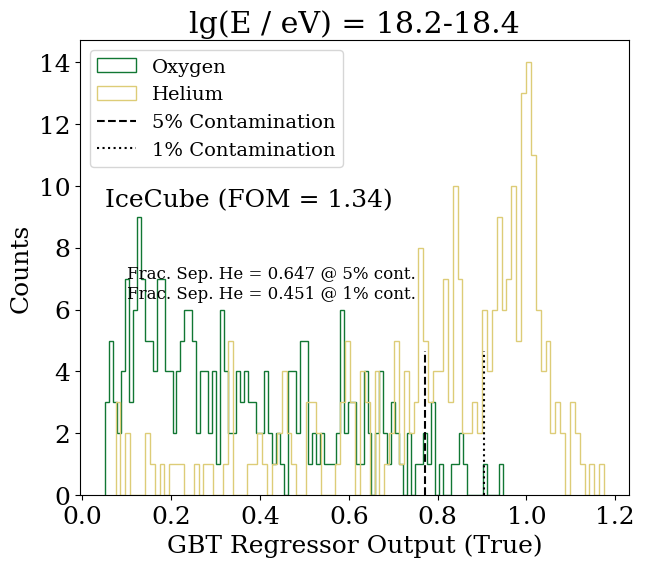



lgE Bin (Center),   FOM,                5% Contamination,   1% Contamination,   # Events
16.1                 1.15                 0.498                0.234                494                 
16.3                 1.27                 0.569                0.427                541                 
16.5                 1.65                 0.749                0.333                541                 
16.7                 1.39                 0.617                0.456                559                 
16.9                 1.36                 0.622                0.400                525                 
17.1                 1.52                 0.754                0.625                542                 
17.3                 1.49                 0.695                0.469                534                 
17.5                 1.58                 0.694                0.567                536                 
17.7                 1.47                 0.660                0.485 

In [ ]:
ic_HeO_FOM_true, ic_HeO_5per_true, ic_HeO_1per_true, ic_HeO_numEvents_true = PerformGBTAnalysis("IceCube", lgEBinEdges, pFe=False, HeO=True, pHe=False, smear=False, verbose=False)
PrintGBTResults(lgEBinEdges, ic_HeO_FOM_true, ic_HeO_5per_true, ic_HeO_1per_true, ic_HeO_numEvents_true)

<ipython-input-35-322124611bc6>:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfCuts.ParticleID[dfCuts.ParticleID == 402] = 1




Model trained to separate Helium from Oxygen.
Training the GBDT on smeared data to simulate detector resolutions...
Training the model...
The scores of the GBT Regressor: 0.3184 (training set), 0.2840 (testing set)
(model trained and tested on smeared data)
Calculating model feature importances...
Observable: nMuHighE             Importance: 0.618
Observable: Xmax                 Importance: 0.129
Observable: nMu800m              Importance: 0.12
Observable: nEM_Obslev           Importance: 0.047
Observable: R_eMuHighE           Importance: 0.027
Observable: L                    Importance: 0.026
Observable: R                    Importance: 0.024
Observable: R_eMu800m            Importance: 0.009




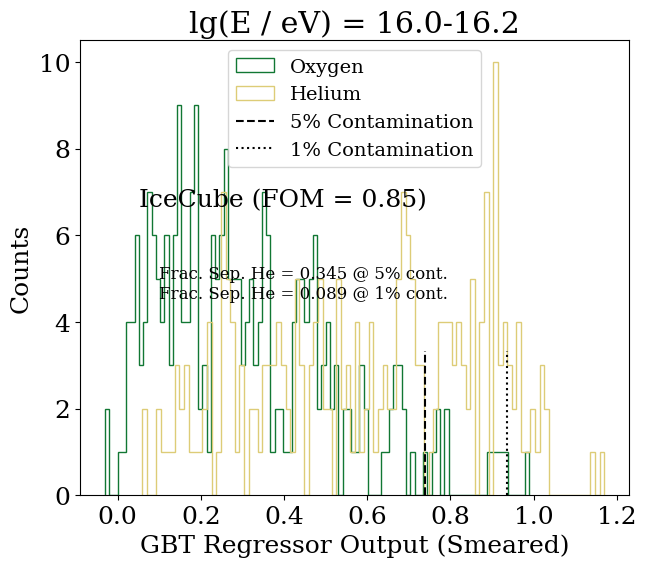

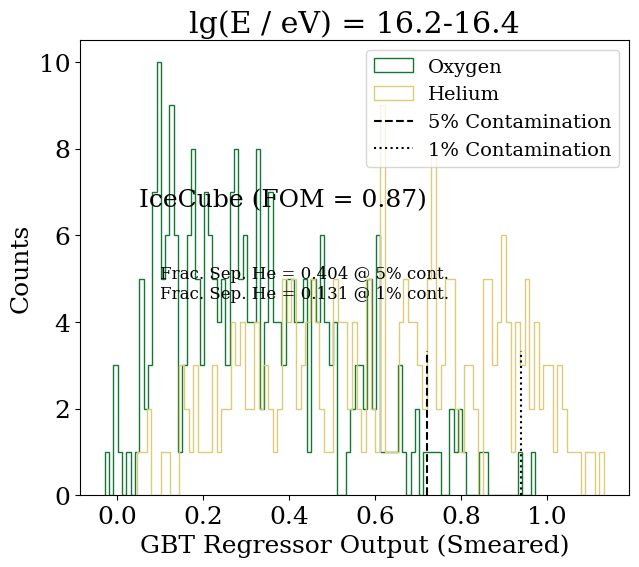

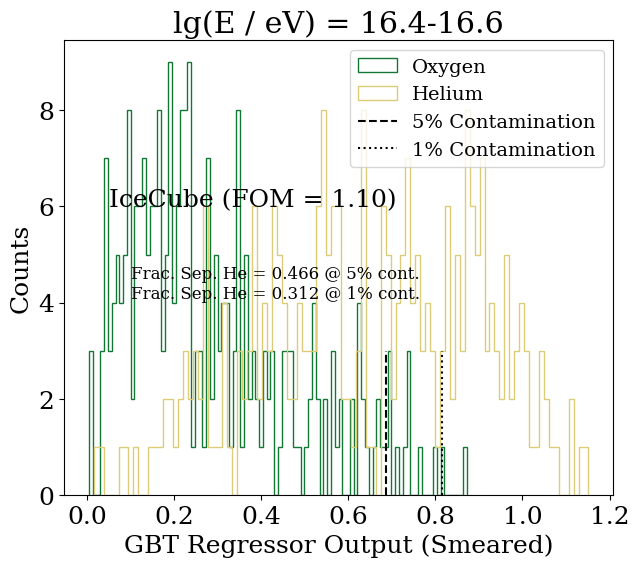

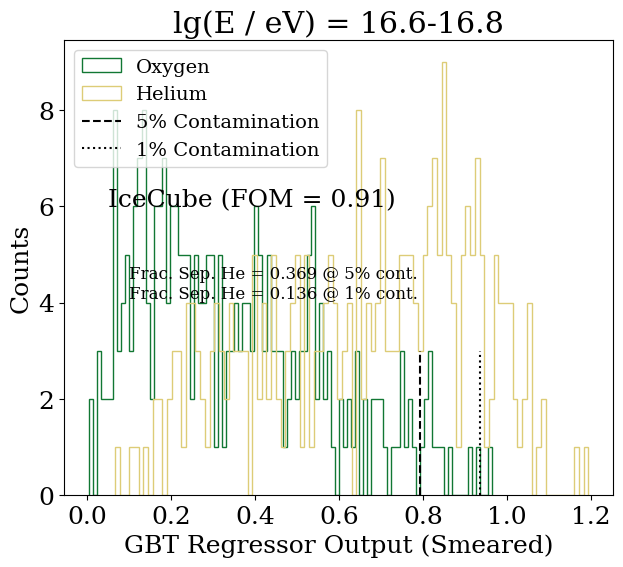

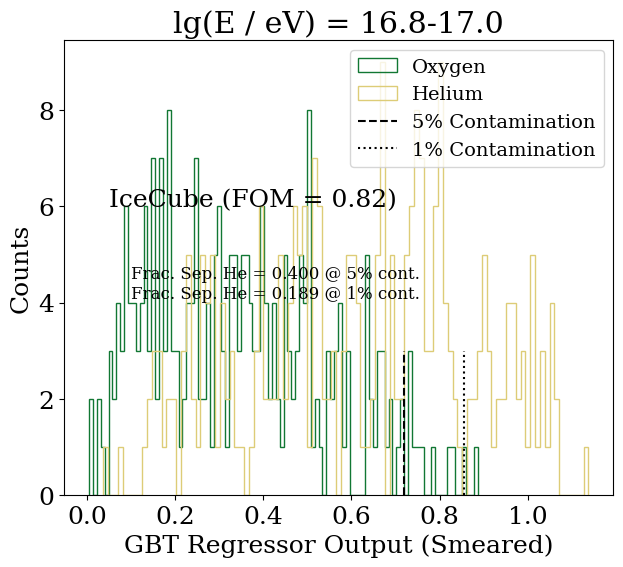

...

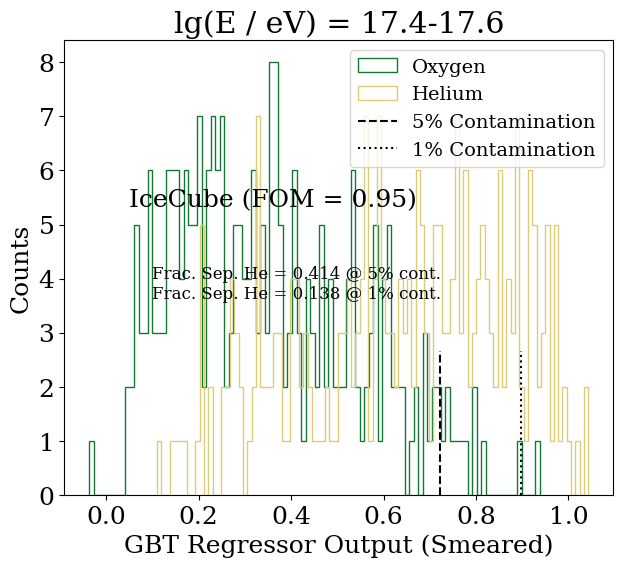

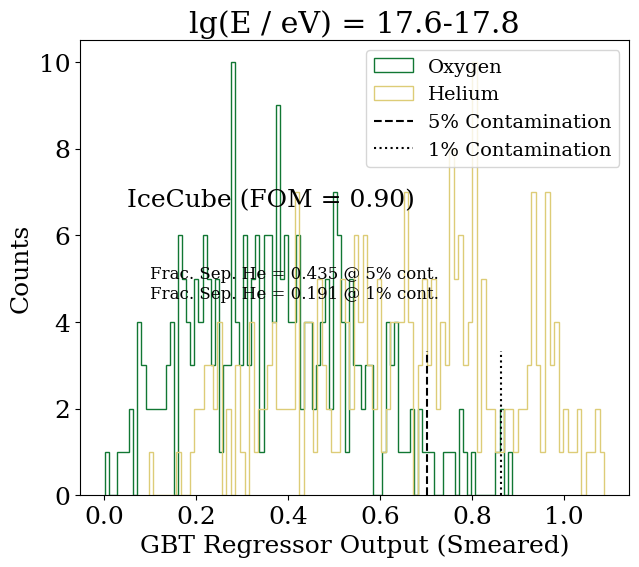

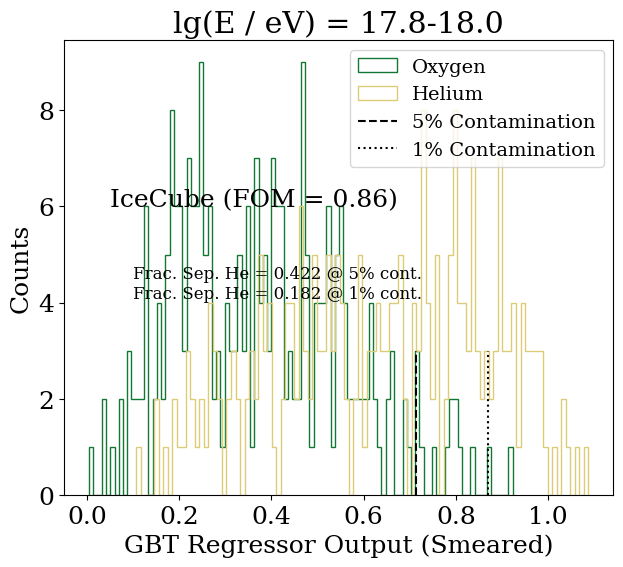

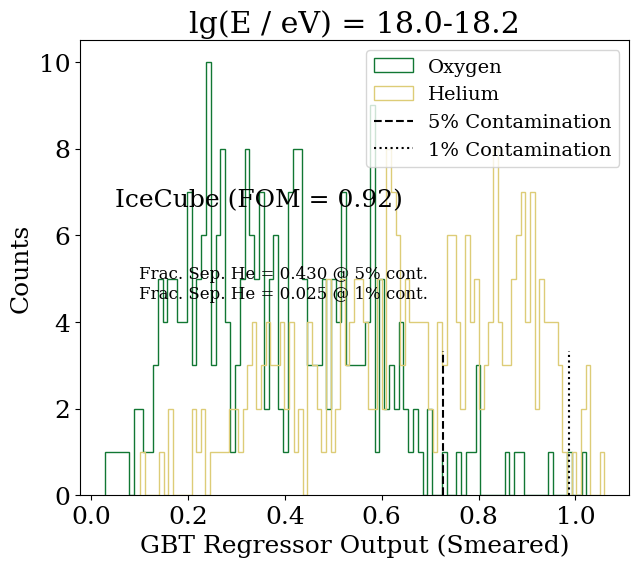

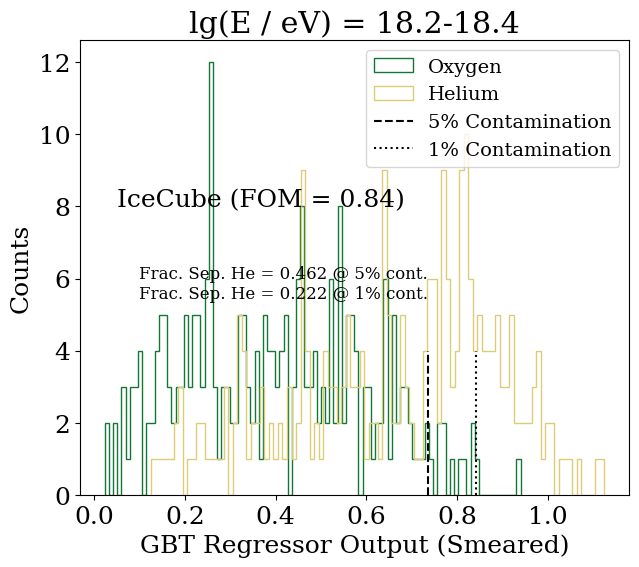



lgE Bin (Center),   FOM,                5% Contamination,   1% Contamination,   # Events
16.1                 0.85                 0.345                0.089                494                 
16.3                 0.87                 0.404                0.131                541                 
16.5                 1.10                 0.466                0.312                541                 
16.7                 0.91                 0.369                0.136                559                 
16.9                 0.82                 0.400                0.189                525                 
17.1                 0.93                 0.460                0.232                542                 
17.3                 0.98                 0.338                0.116                534                 
17.5                 0.95                 0.414                0.138                536                 
17.7                 0.90                 0.435                0.191 

In [ ]:
ic_HeO_FOM_smear, ic_HeO_5per_smear, ic_HeO_1per_smear, ic_HeO_numEvents_smear = PerformGBTAnalysis("IceCube", lgEBinEdges, pFe=False, HeO=True, pHe=False, smear=True, verbose=False)
PrintGBTResults(lgEBinEdges, ic_HeO_FOM_smear, ic_HeO_5per_smear, ic_HeO_1per_smear, ic_HeO_numEvents_smear)

# IceCube (p He Separation)

<ipython-input-35-322124611bc6>:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfCuts.ParticleID[dfCuts.ParticleID == 14] = 1




Model trained to separate Proton from Helium.
Training the model...
The scores of the GBT Regressor: 0.2493 (training set), 0.1246 (testing set)
(model trained on exact knowledge data but tested on smeared data)
Calculating model feature importances...
Observable: nMuHighE             Importance: 0.709
Observable: nMu800m              Importance: 0.167
Observable: nEM_Obslev           Importance: 0.048
Observable: Xmax                 Importance: 0.039
Observable: L                    Importance: 0.012
Observable: R                    Importance: 0.01
Observable: R_eMu800m            Importance: 0.008
Observable: R_eMuHighE           Importance: 0.006


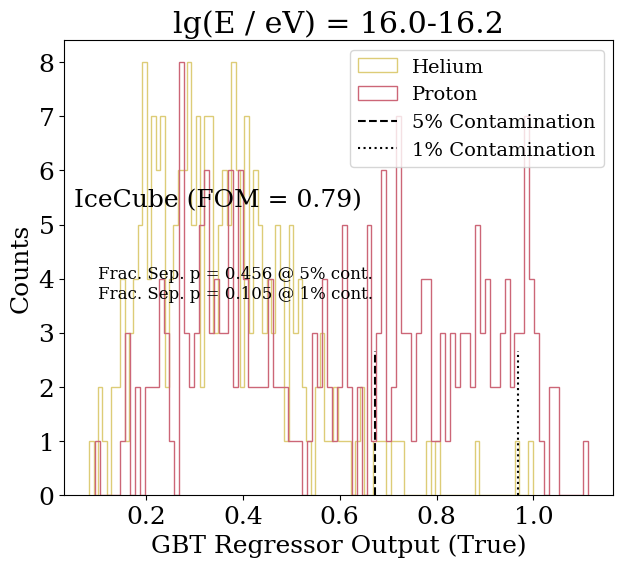

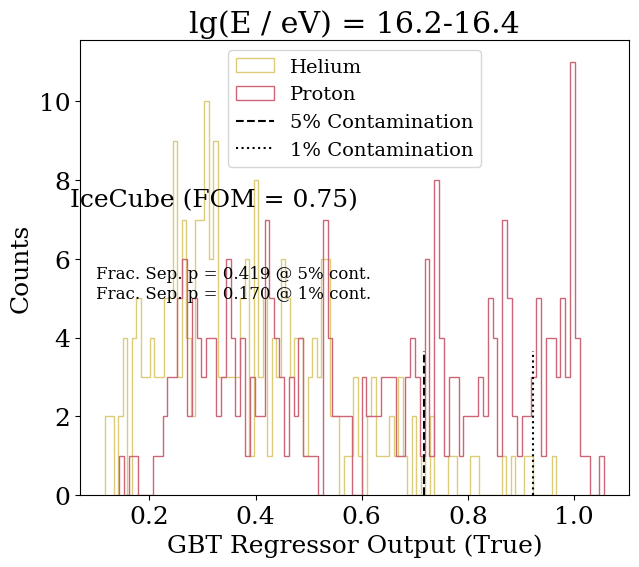

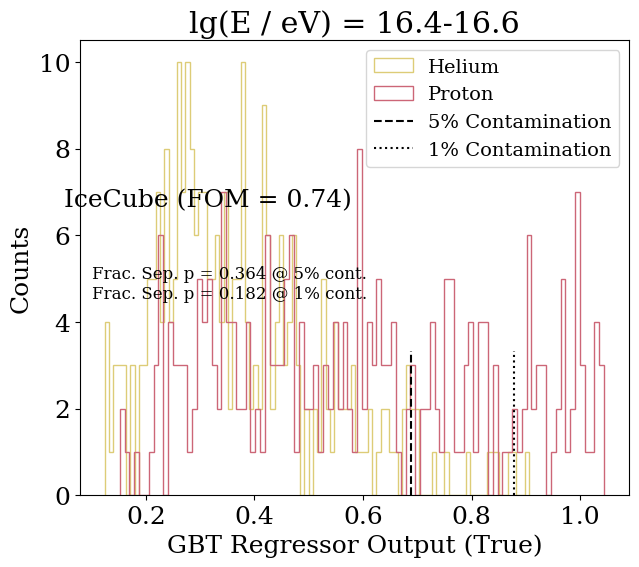

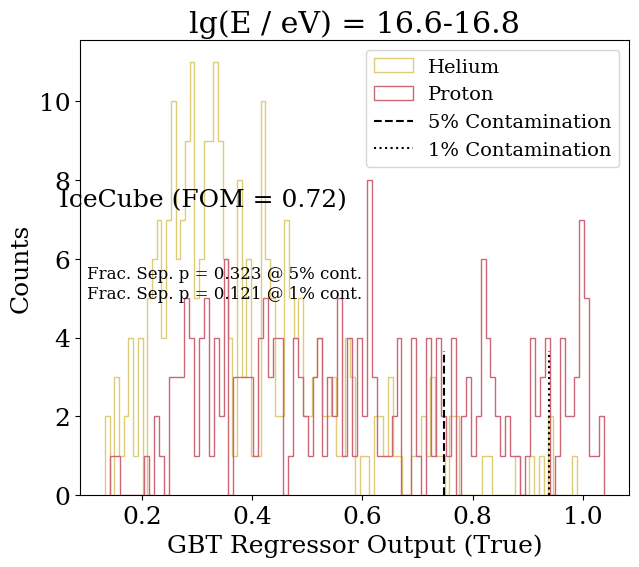

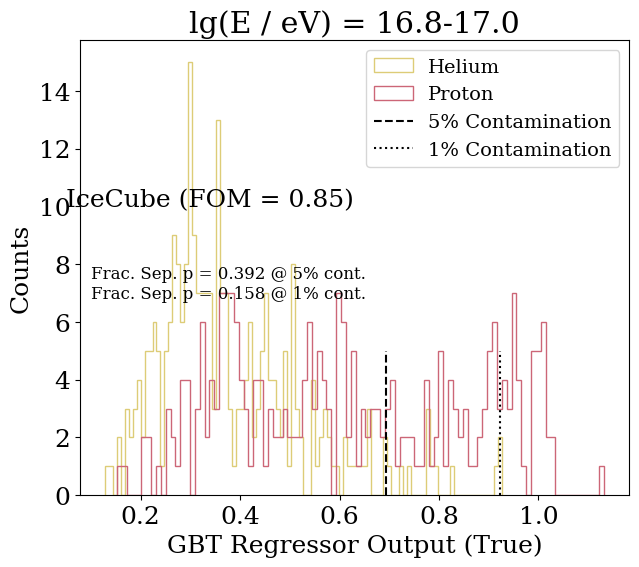

...

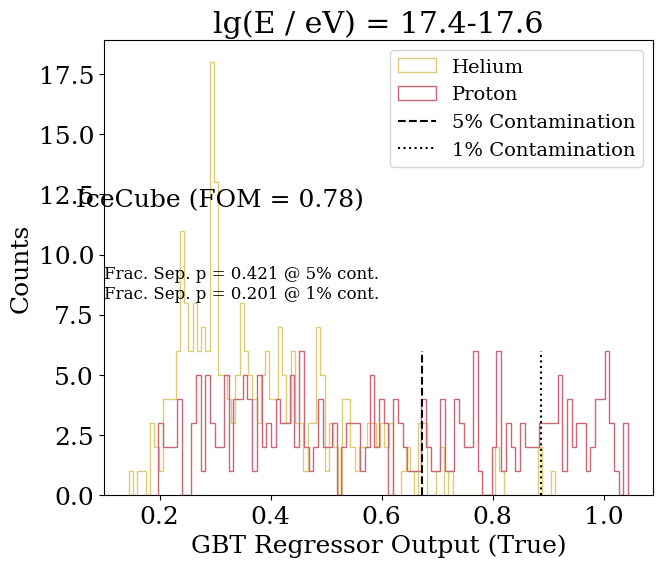

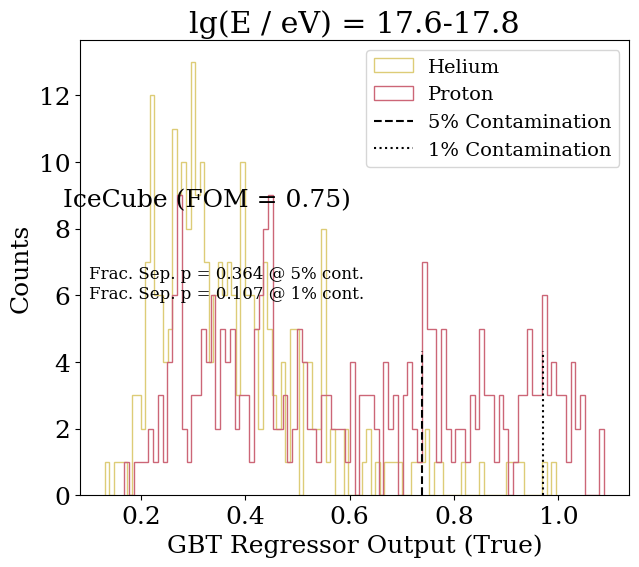

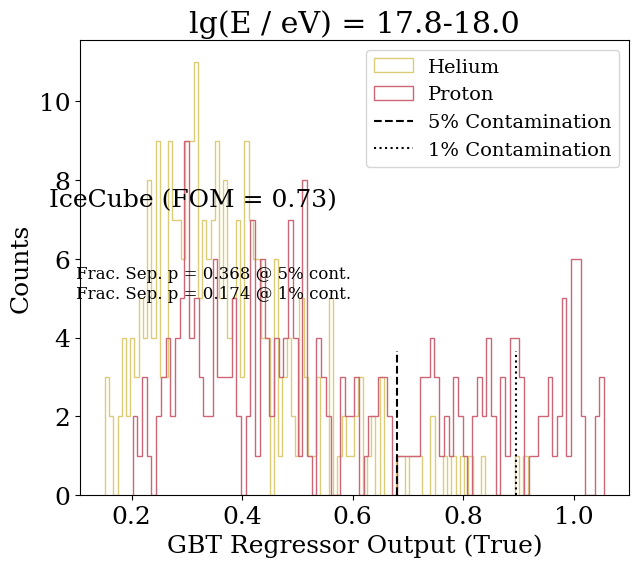

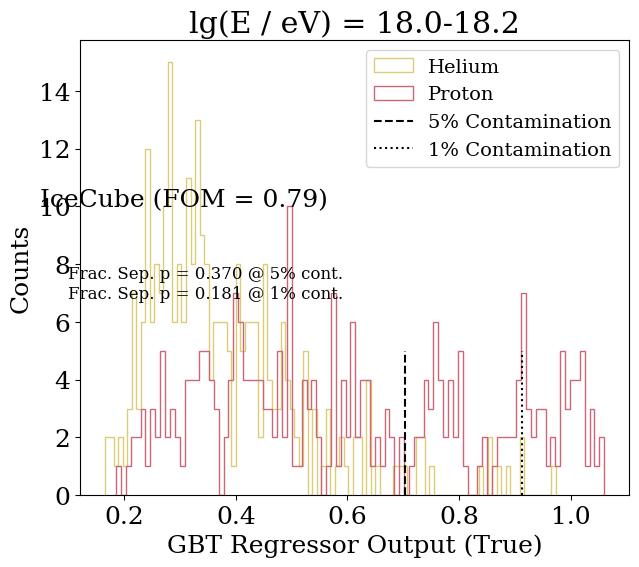

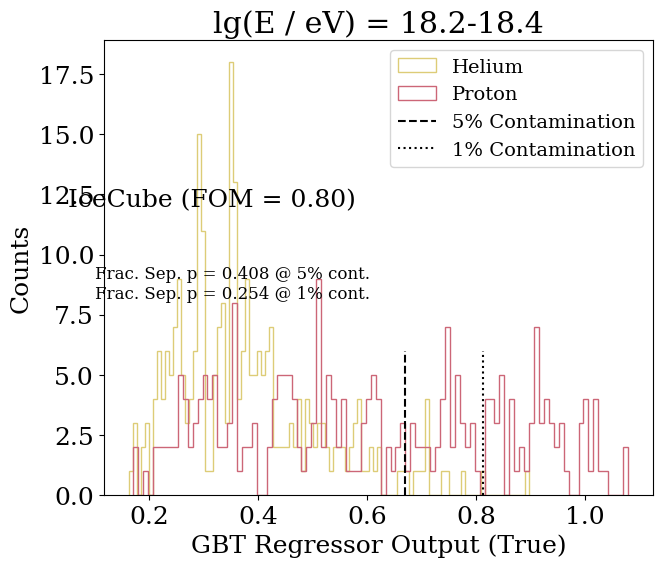



lgE Bin (Center),   FOM,                5% Contamination,   1% Contamination,   # Events
16.1                 0.79                 0.456                0.105                470                 
16.3                 0.75                 0.419                0.170                514                 
16.5                 0.74                 0.364                0.182                539                 
16.7                 0.72                 0.323                0.121                507                 
16.9                 0.85                 0.392                0.158                531                 
17.1                 0.74                 0.361                0.102                506                 
17.3                 0.70                 0.299                0.185                526                 
17.5                 0.78                 0.421                0.201                539                 
17.7                 0.75                 0.364                0.107 

In [ ]:
ic_pHe_FOM_true, ic_pHe_5per_true, ic_pHe_1per_true, ic_pHe_numEvents_true = PerformGBTAnalysis("IceCube", lgEBinEdges, pFe=False, HeO=False, pHe=True, smear=False, verbose=False)
PrintGBTResults(lgEBinEdges, ic_pHe_FOM_true, ic_pHe_5per_true, ic_pHe_1per_true, ic_pHe_numEvents_true)

<ipython-input-35-322124611bc6>:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfCuts.ParticleID[dfCuts.ParticleID == 14] = 1




Model trained to separate Proton from Helium.
Training the GBDT on smeared data to simulate detector resolutions...
Training the model...
The scores of the GBT Regressor: 0.2005 (training set), 0.1737 (testing set)
(model trained and tested on smeared data)
Calculating model feature importances...
Observable: nMuHighE             Importance: 0.663
Observable: nMu800m              Importance: 0.133
Observable: Xmax                 Importance: 0.09
Observable: L                    Importance: 0.041
Observable: nEM_Obslev           Importance: 0.032
Observable: R_eMuHighE           Importance: 0.019
Observable: R_eMu800m            Importance: 0.014
Observable: R                    Importance: 0.007




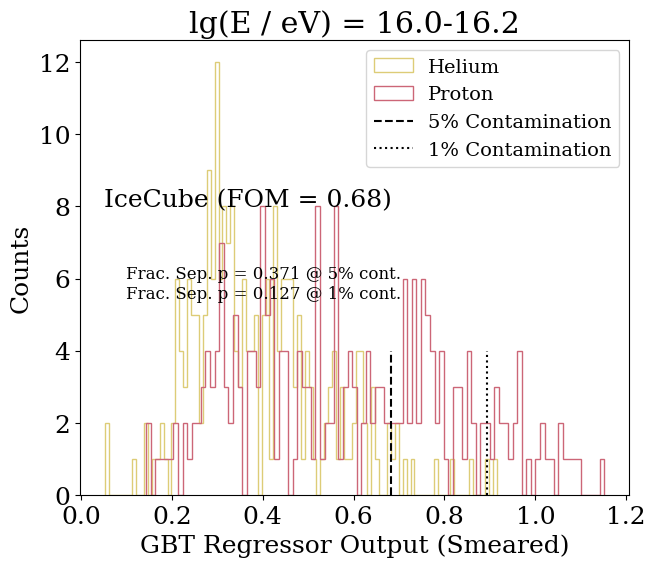

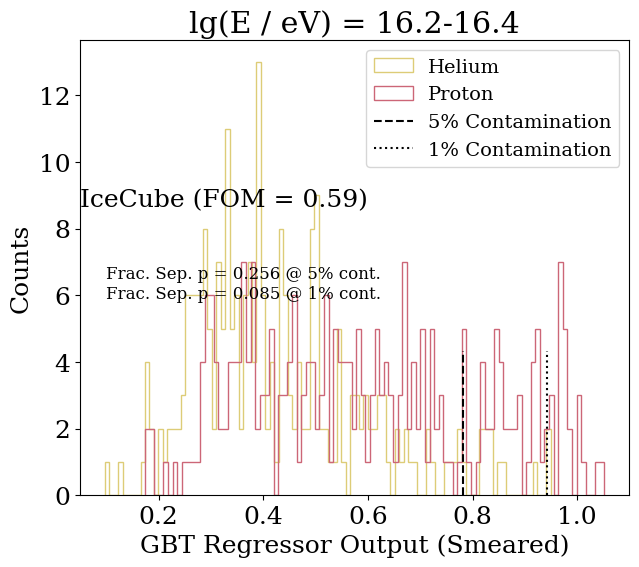

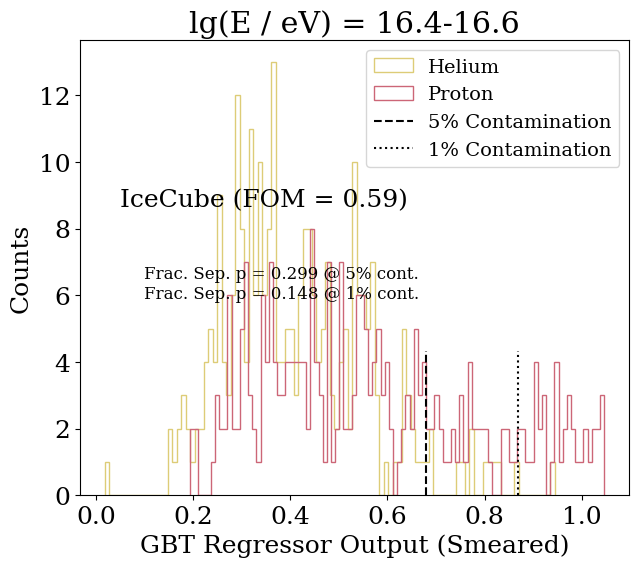

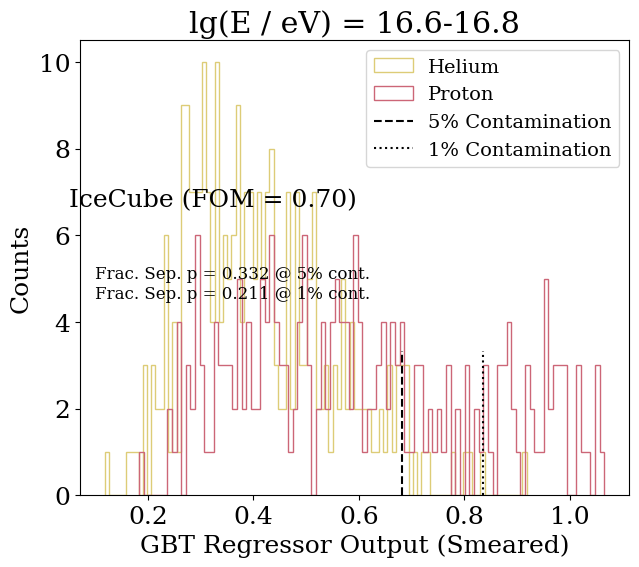

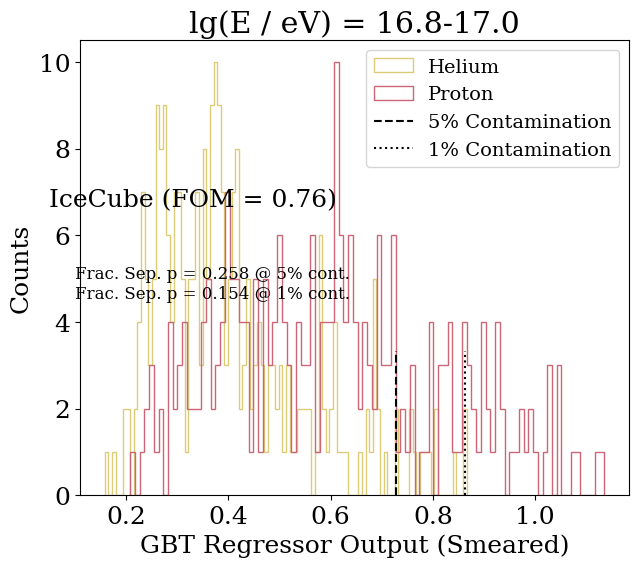

...

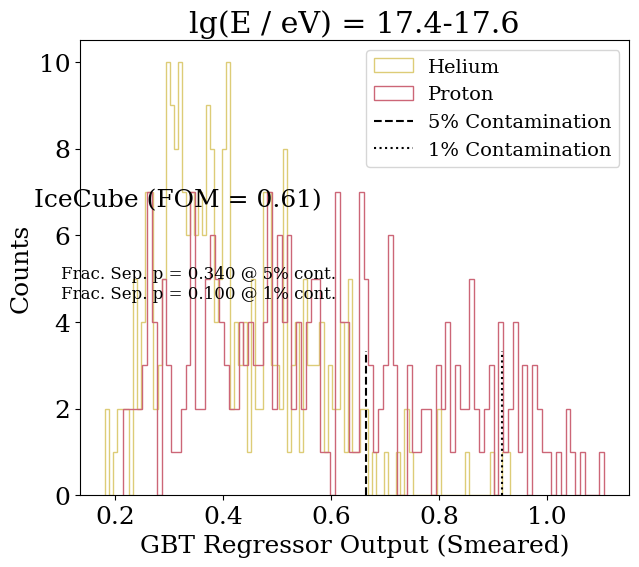

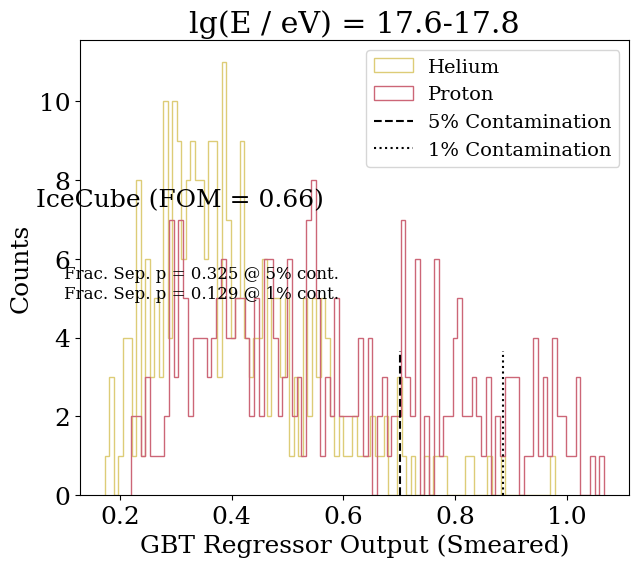

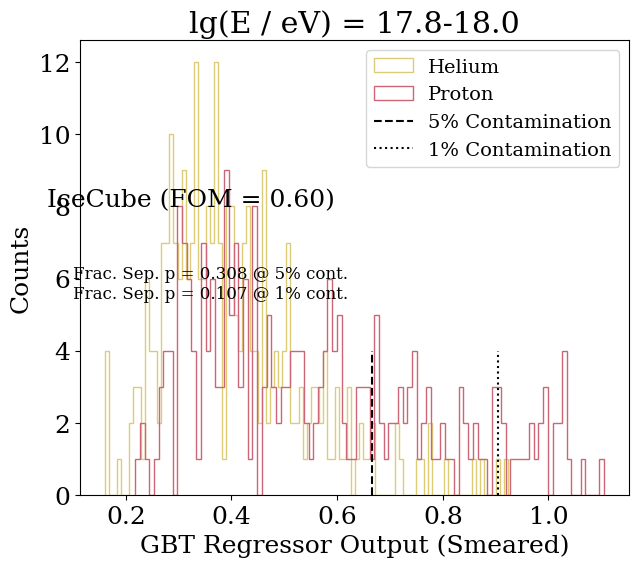

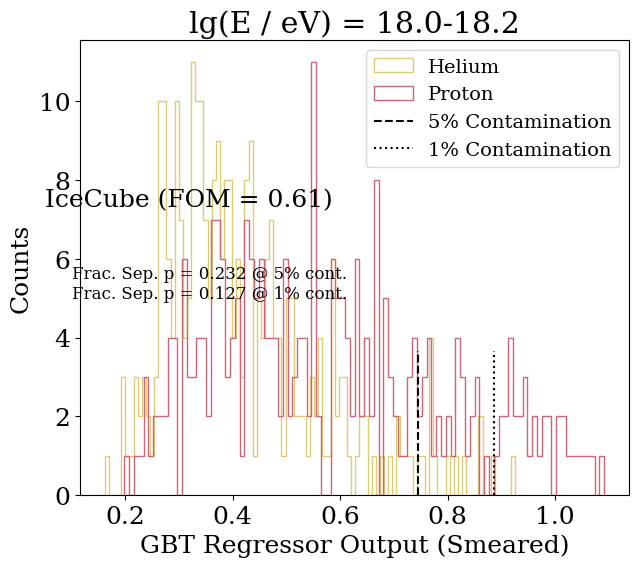

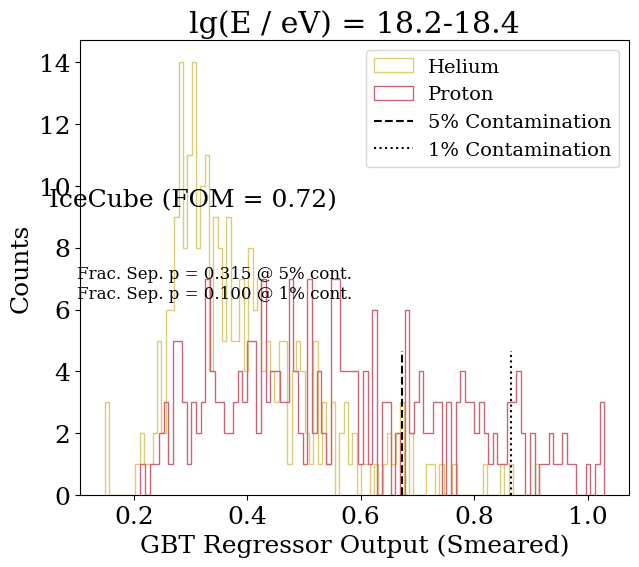



lgE Bin (Center),   FOM,                5% Contamination,   1% Contamination,   # Events
16.1                 0.68                 0.371                0.127                470                 
16.3                 0.59                 0.256                0.085                514                 
16.5                 0.59                 0.299                0.148                539                 
16.7                 0.70                 0.332                0.211                507                 
16.9                 0.76                 0.258                0.154                531                 
17.1                 0.64                 0.316                0.090                506                 
17.3                 0.58                 0.228                0.126                526                 
17.5                 0.61                 0.340                0.100                539                 
17.7                 0.66                 0.325                0.129 

In [ ]:
ic_pHe_FOM_smear, ic_pHe_5per_smear, ic_pHe_1per_smear, ic_pHe_numEvents_smear = PerformGBTAnalysis("IceCube", lgEBinEdges, pFe=False, HeO=False, pHe=True, smear=True, verbose=False)
PrintGBTResults(lgEBinEdges, ic_pHe_FOM_smear, ic_pHe_5per_smear, ic_pHe_1per_smear, ic_pHe_numEvents_smear)

# Auger (p Fe Separation)

<ipython-input-35-322124611bc6>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfCuts.ParticleID[dfCuts.ParticleID == 14] = 1




Model trained to separate Proton from Iron.
Training the model...
The scores of the GBT Regressor: 0.9628 (training set), 0.5345 (testing set)
(model trained on exact knowledge data but tested on smeared data)
Calculating model feature importances...
Observable: Xmax                 Importance: 0.673
Observable: nMu800m              Importance: 0.248
Observable: R_eMu800m            Importance: 0.049
Observable: R                    Importance: 0.023
Observable: nEM_Obslev           Importance: 0.007
Observable: L                    Importance: 0.0


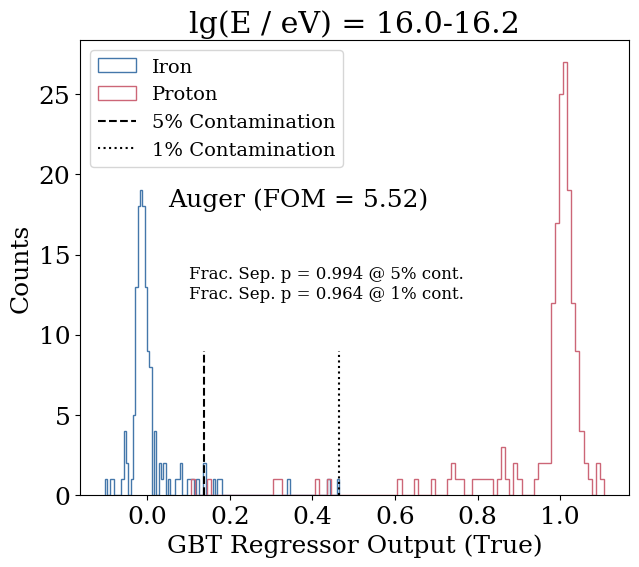

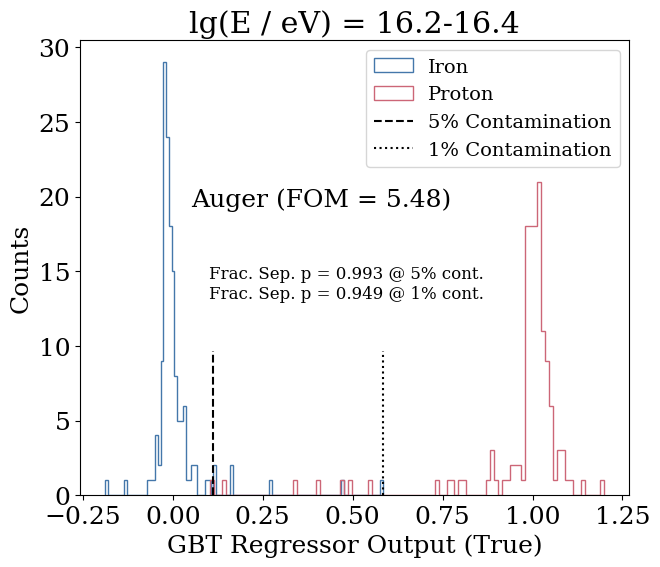

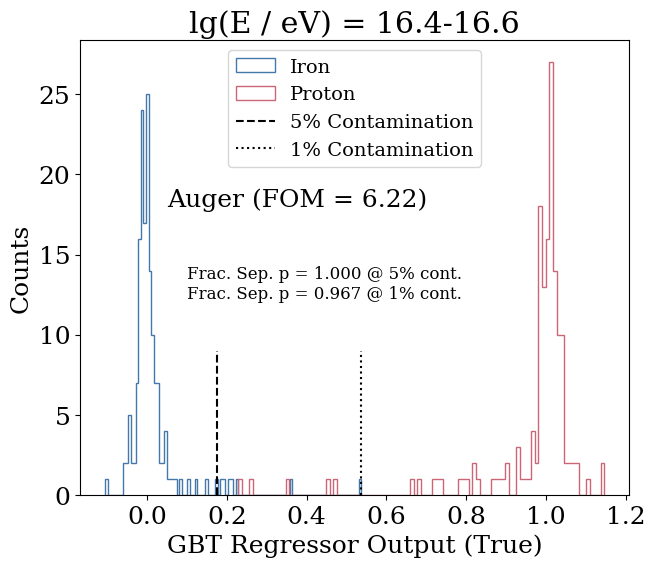

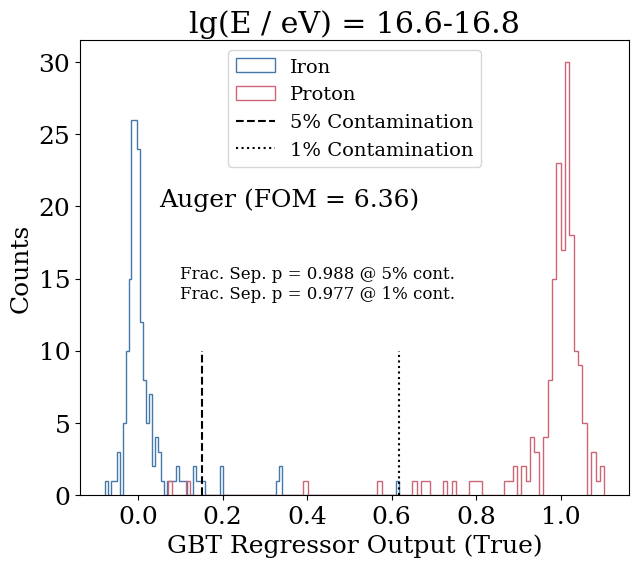

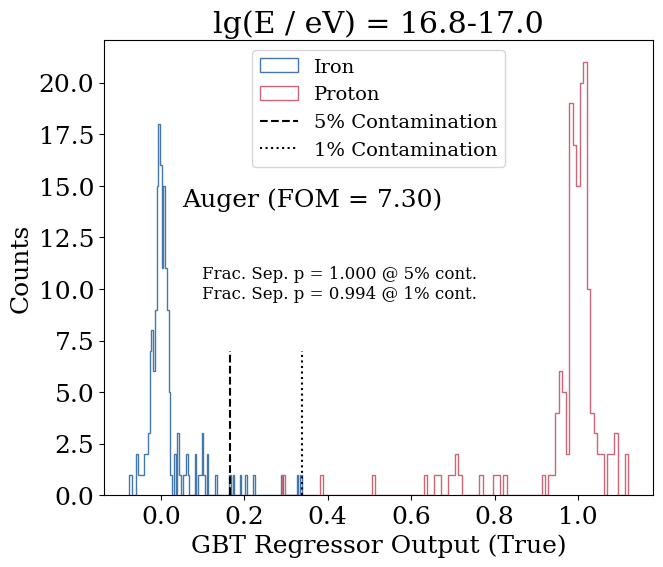

...

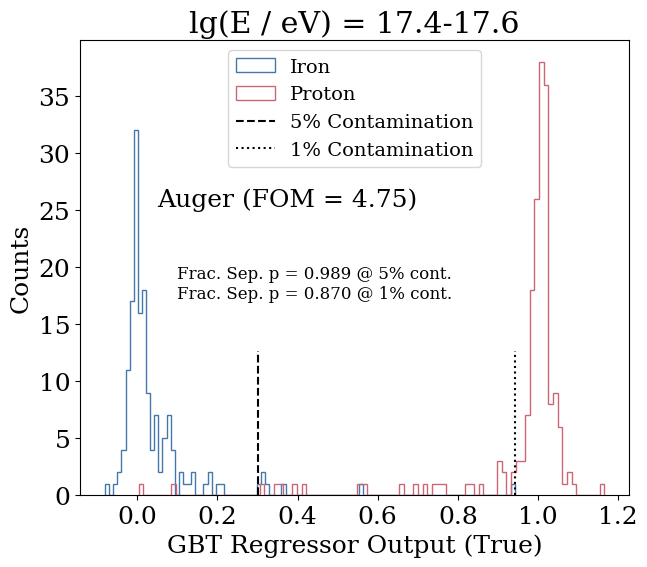

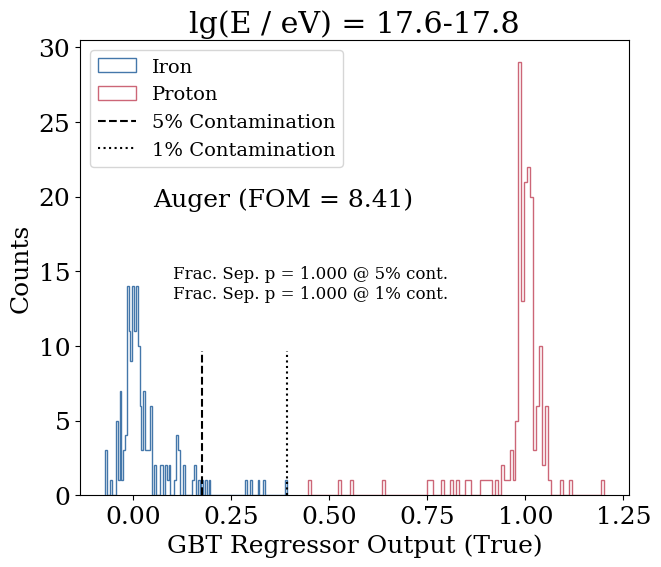

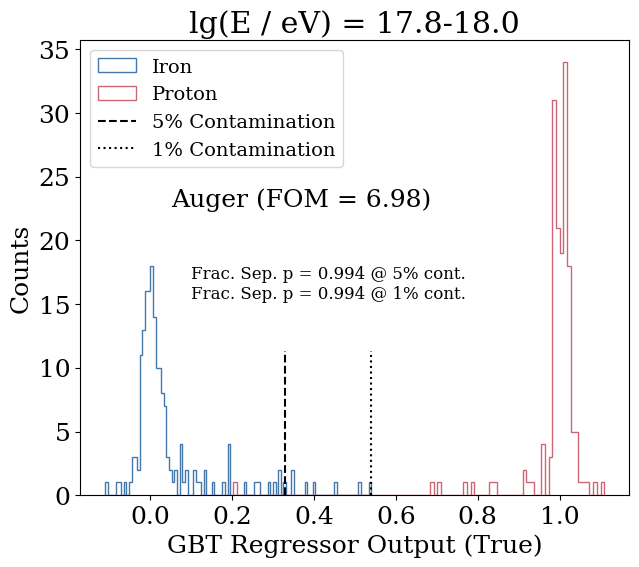

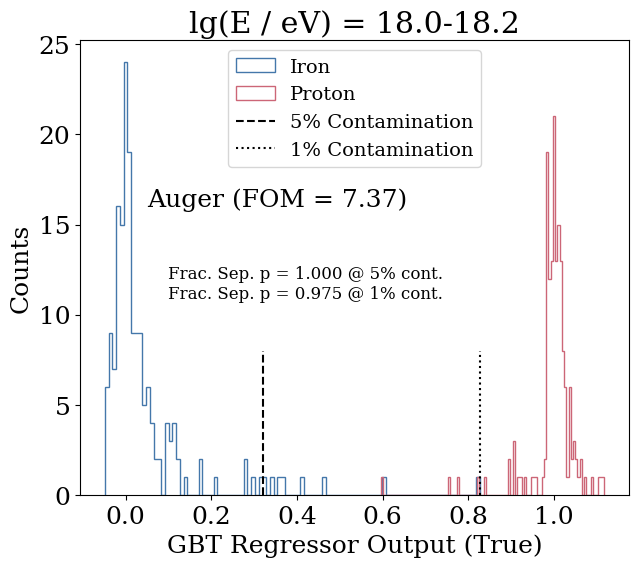

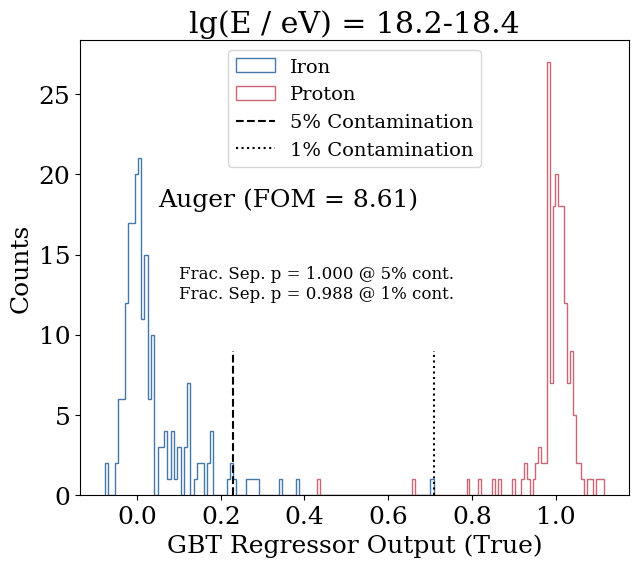



lgE Bin (Center),   FOM,                5% Contamination,   1% Contamination,   # Events
16.1                 5.52                 0.994                0.964                305                 
16.3                 5.48                 0.993                0.949                283                 
16.5                 6.22                 1.000                0.967                318                 
16.7                 6.36                 0.988                0.977                344                 
16.9                 7.30                 1.000                0.994                333                 
17.1                 5.58                 1.000                0.904                351                 
17.3                 8.35                 1.000                1.000                340                 
17.5                 4.75                 0.989                0.870                342                 
17.7                 8.41                 1.000                1.000 

In [ ]:
auger_pFe_FOM_true, auger_pFe_5per_true, auger_pFe_1per_true, auger_pFe_numEvents_true = PerformGBTAnalysis("Auger", lgEBinEdges, pFe=True, HeO=False, pHe=False, smear=False, verbose=False)
PrintGBTResults(lgEBinEdges, auger_pFe_FOM_true, auger_pFe_5per_true, auger_pFe_1per_true, auger_pFe_numEvents_true)

<ipython-input-35-322124611bc6>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfCuts.ParticleID[dfCuts.ParticleID == 14] = 1




Model trained to separate Proton from Iron.
Training the GBDT on smeared data to simulate detector resolutions...
Training the model...
The scores of the GBT Regressor: 0.7744 (training set), 0.7705 (testing set)
(model trained and tested on smeared data)
Calculating model feature importances...
Observable: Xmax                 Importance: 0.788
Observable: nMu800m              Importance: 0.161
Observable: R_eMu800m            Importance: 0.022
Observable: R                    Importance: 0.016
Observable: L                    Importance: 0.011
Observable: nEM_Obslev           Importance: 0.002




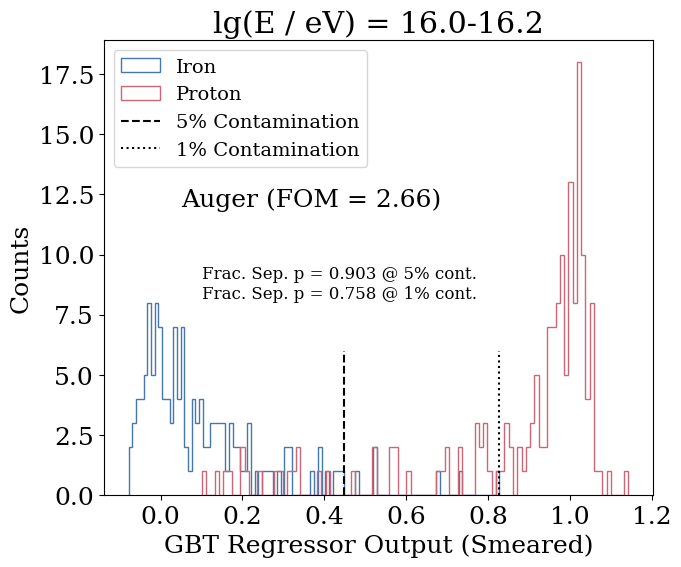

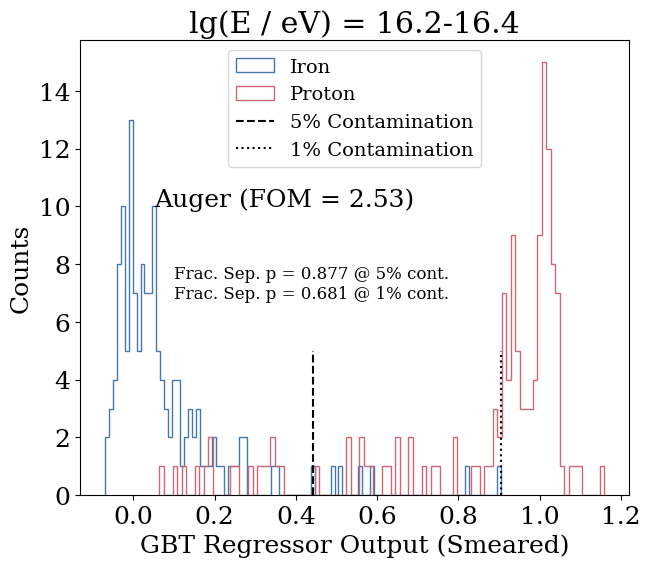

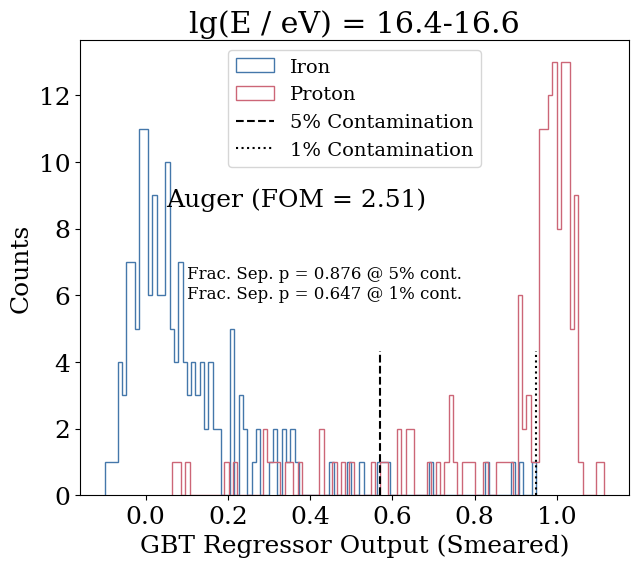

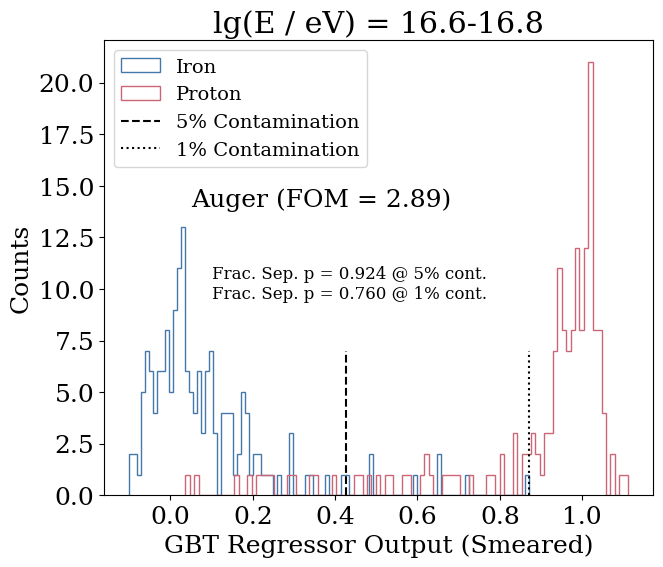

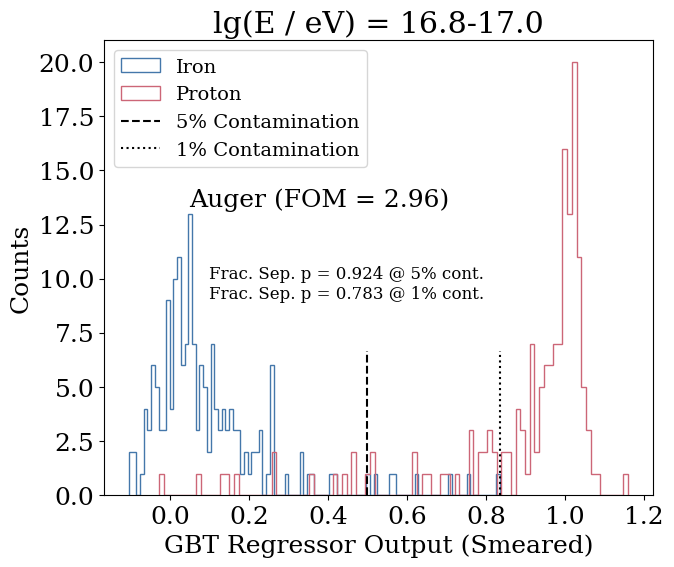

...

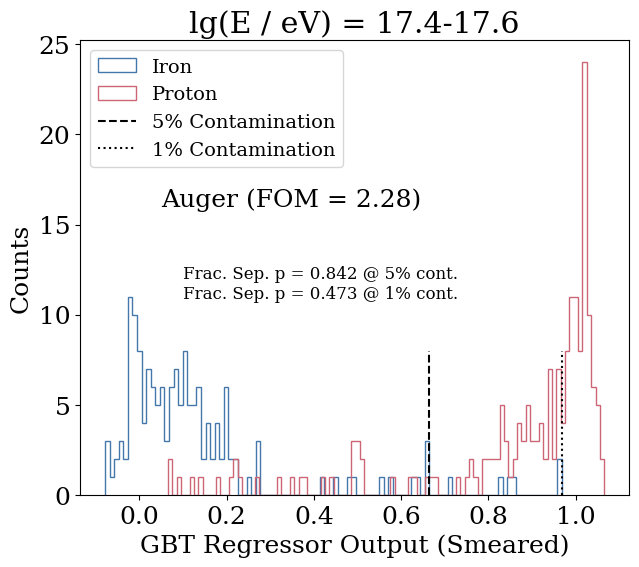

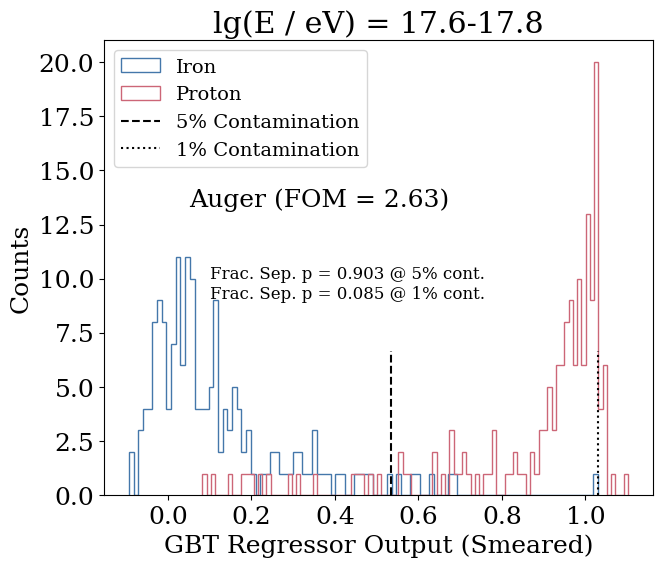

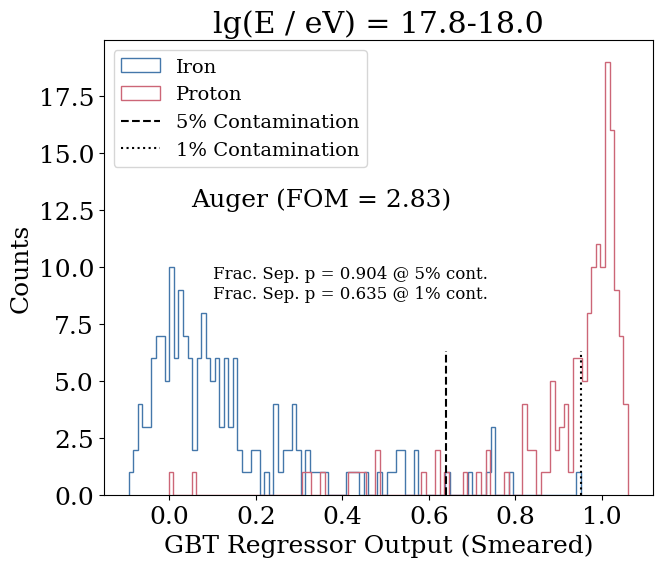

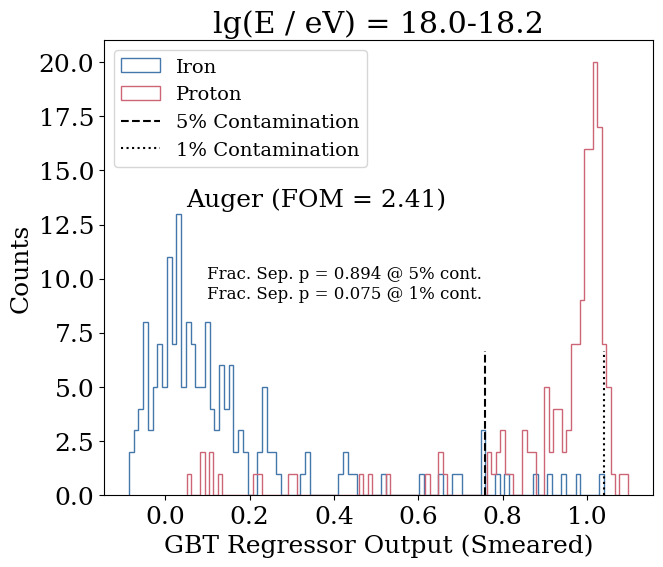

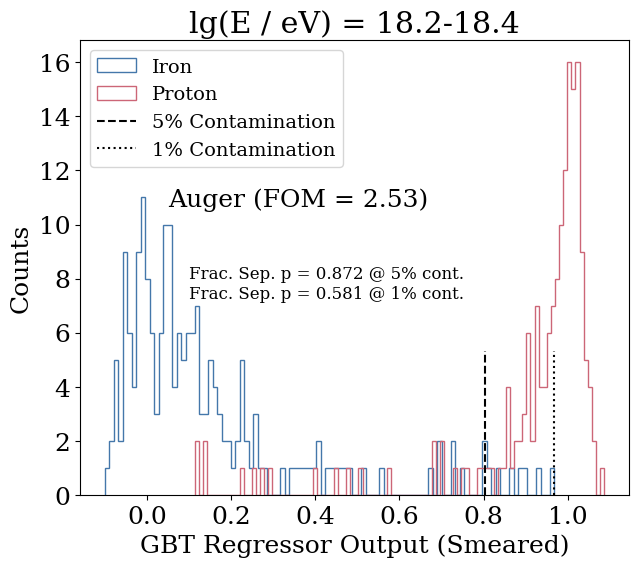



lgE Bin (Center),   FOM,                5% Contamination,   1% Contamination,   # Events
16.1                 2.66                 0.903                0.758                305                 
16.3                 2.53                 0.877                0.681                283                 
16.5                 2.51                 0.876                0.647                318                 
16.7                 2.89                 0.924                0.760                344                 
16.9                 2.96                 0.924                0.783                333                 
17.1                 2.90                 0.930                0.706                351                 
17.3                 2.22                 0.815                0.726                340                 
17.5                 2.28                 0.842                0.473                342                 
17.7                 2.63                 0.903                0.085 

In [ ]:
auger_pFe_FOM_smear, auger_pFe_5per_smear, auger_pFe_1per_smear, auger_pFe_numEvents_smear = PerformGBTAnalysis("Auger", lgEBinEdges, pFe=True, HeO=False, pHe=False, smear=True, verbose=False)
PrintGBTResults(lgEBinEdges, auger_pFe_FOM_smear, auger_pFe_5per_smear, auger_pFe_1per_smear, auger_pFe_numEvents_smear)

# Auger (He O Separation)

<ipython-input-35-322124611bc6>:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfCuts.ParticleID[dfCuts.ParticleID == 402] = 1




Model trained to separate Helium from Oxygen.
Training the model...
The scores of the GBT Regressor: 0.5595 (training set), -0.0546 (testing set)
(model trained on exact knowledge data but tested on smeared data)
Calculating model feature importances...
Observable: nMu800m              Importance: 0.377
Observable: Xmax                 Importance: 0.251
Observable: R_eMu800m            Importance: 0.25
Observable: R                    Importance: 0.058
Observable: nEM_Obslev           Importance: 0.051
Observable: L                    Importance: 0.014


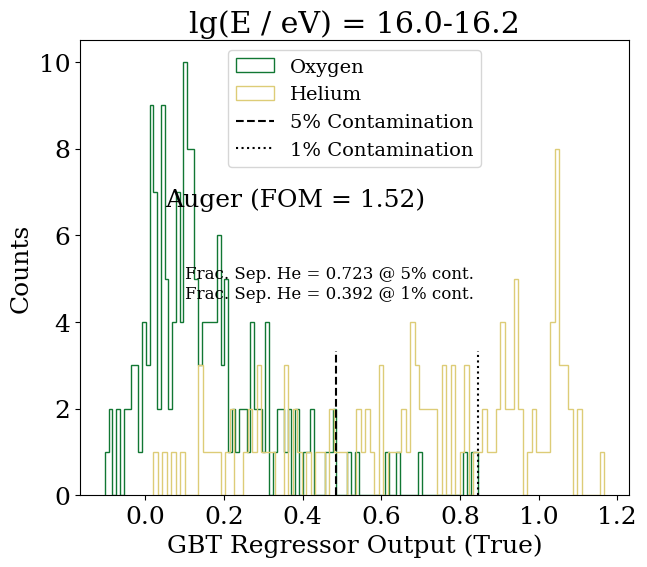

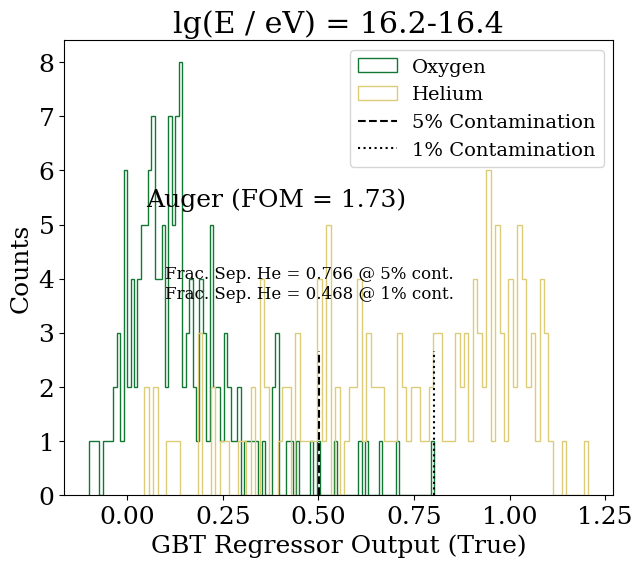

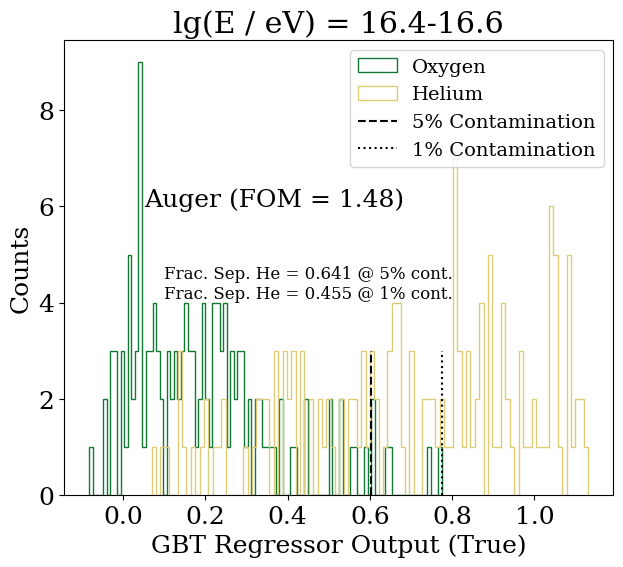

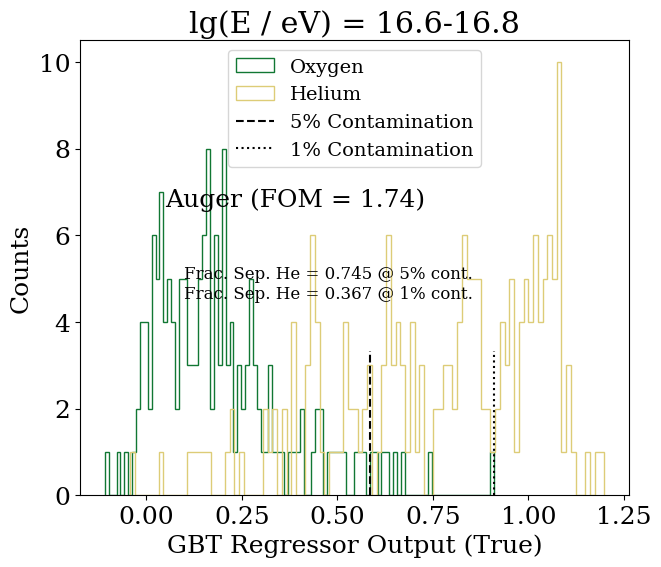

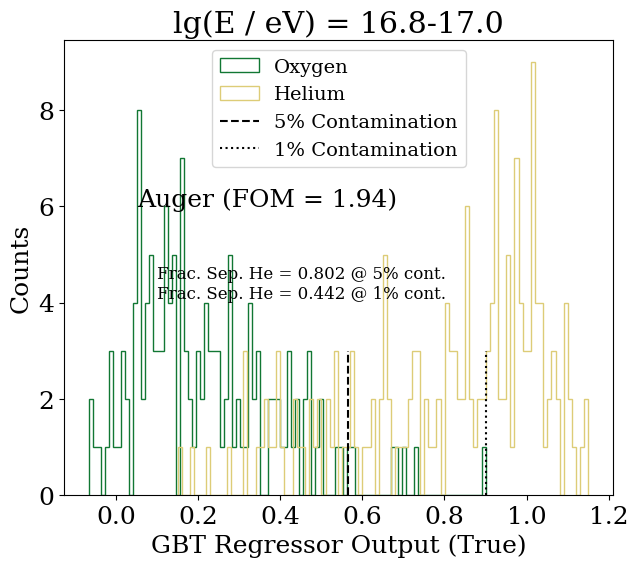

...

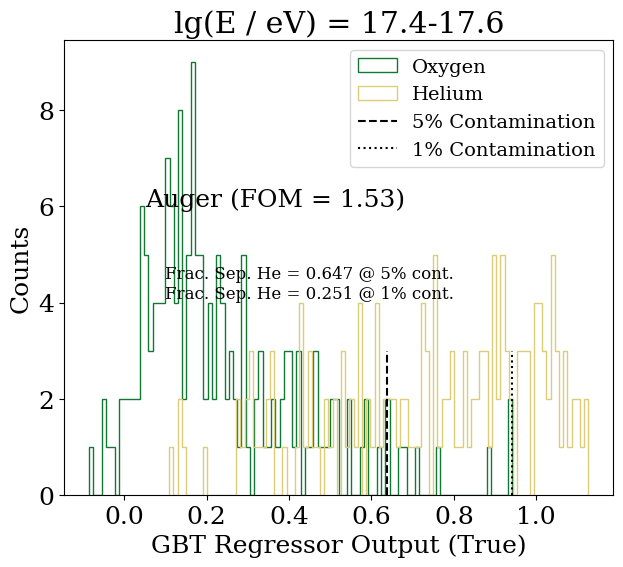

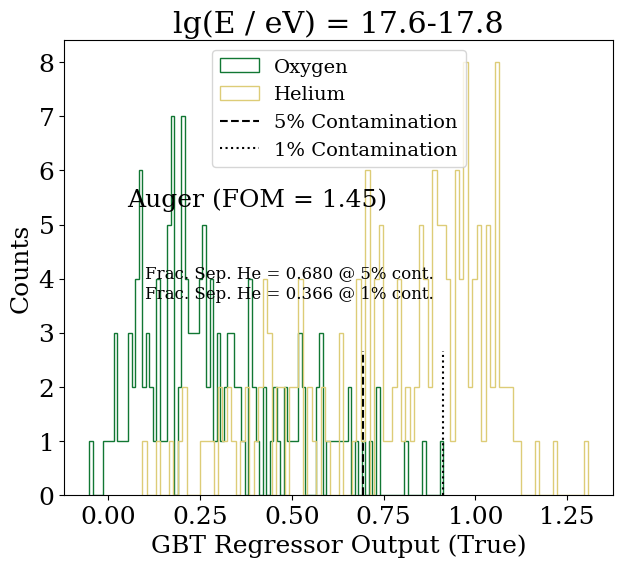

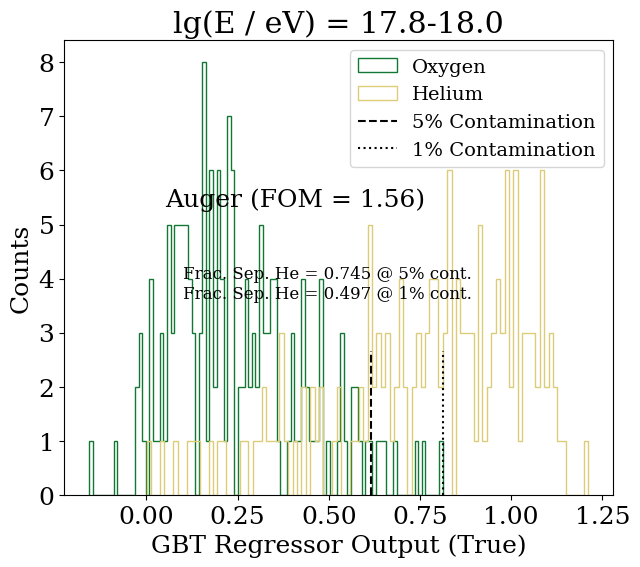

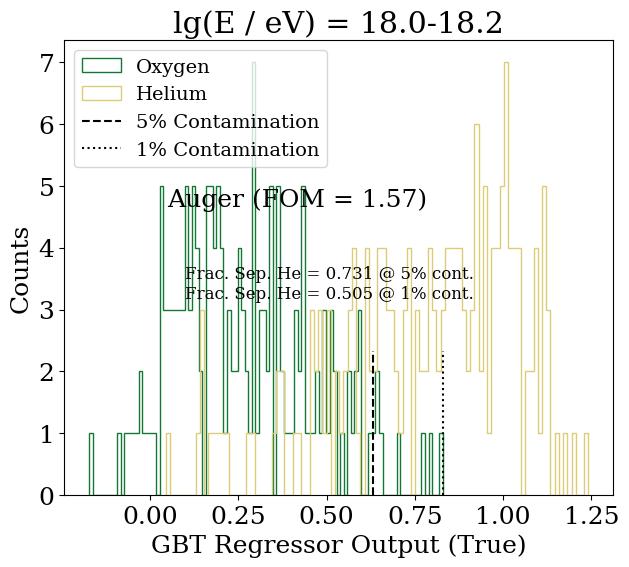

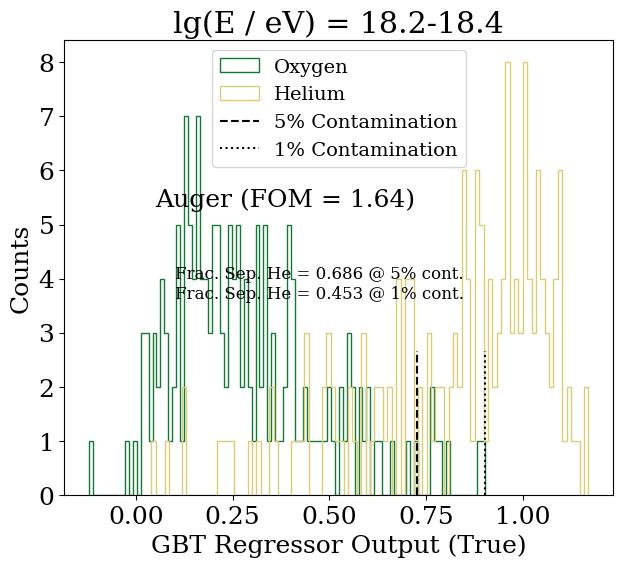



lgE Bin (Center),   FOM,                5% Contamination,   1% Contamination,   # Events
16.1                 1.52                 0.723                0.392                314                 
16.3                 1.73                 0.766                0.468                313                 
16.5                 1.48                 0.641                0.455                294                 
16.7                 1.74                 0.745                0.367                362                 
16.9                 1.94                 0.802                0.442                318                 
17.1                 1.31                 0.561                0.231                340                 
17.3                 1.61                 0.702                0.309                374                 
17.5                 1.53                 0.647                0.251                339                 
17.7                 1.45                 0.680                0.366 

In [ ]:
auger_HeO_FOM_true, auger_HeO_5per_true, auger_HeO_1per_true, auger_HeO_numEvents_true = PerformGBTAnalysis("Auger", lgEBinEdges, pFe=False, HeO=True, pHe=False, smear=False, verbose=False)
PrintGBTResults(lgEBinEdges, auger_HeO_FOM_true, auger_HeO_5per_true, auger_HeO_1per_true, auger_HeO_numEvents_true)

<ipython-input-35-322124611bc6>:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfCuts.ParticleID[dfCuts.ParticleID == 402] = 1




Model trained to separate Helium from Oxygen.
Training the GBDT on smeared data to simulate detector resolutions...
Training the model...
The scores of the GBT Regressor: 0.2690 (training set), 0.2484 (testing set)
(model trained and tested on smeared data)
Calculating model feature importances...
Observable: Xmax                 Importance: 0.529
Observable: nMu800m              Importance: 0.25
Observable: R_eMu800m            Importance: 0.088
Observable: R                    Importance: 0.061
Observable: L                    Importance: 0.055
Observable: nEM_Obslev           Importance: 0.017




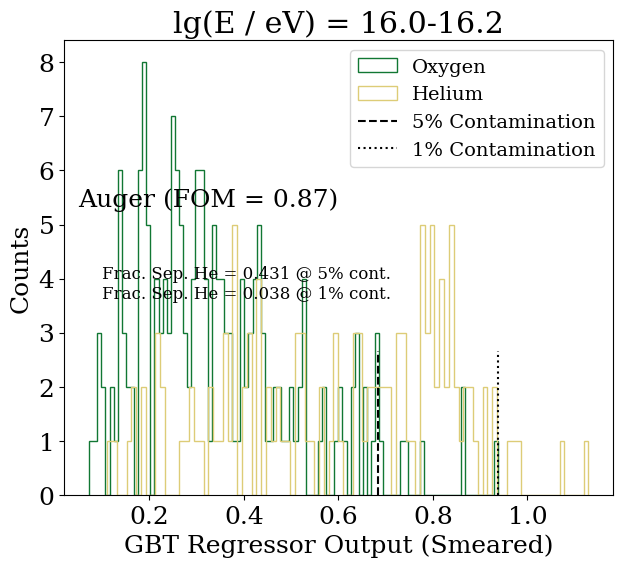

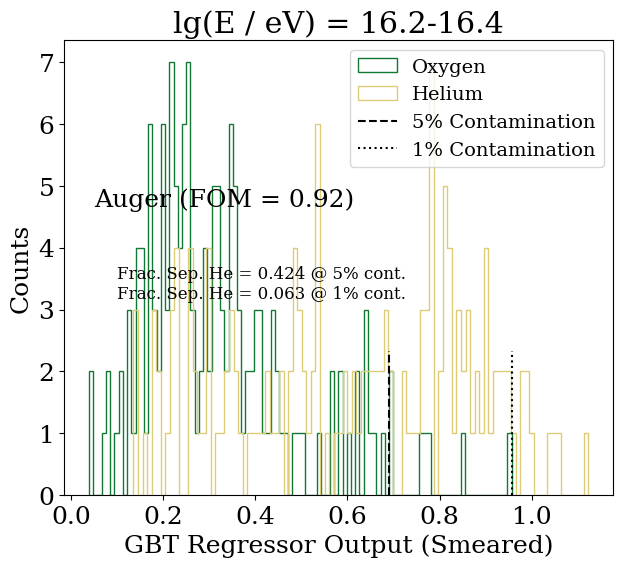

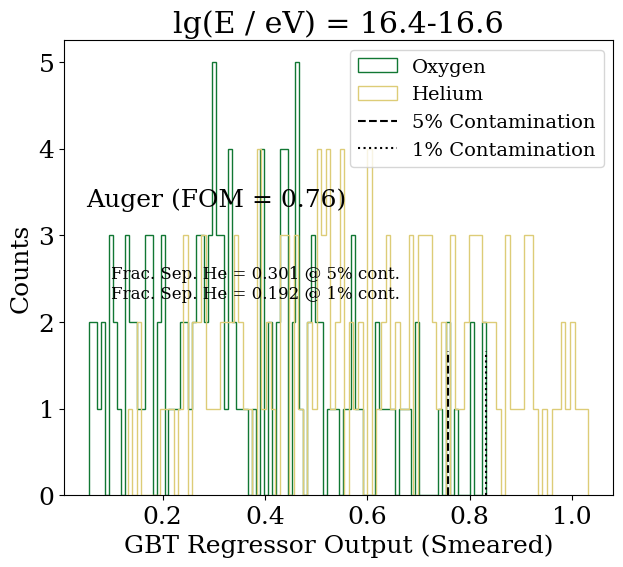

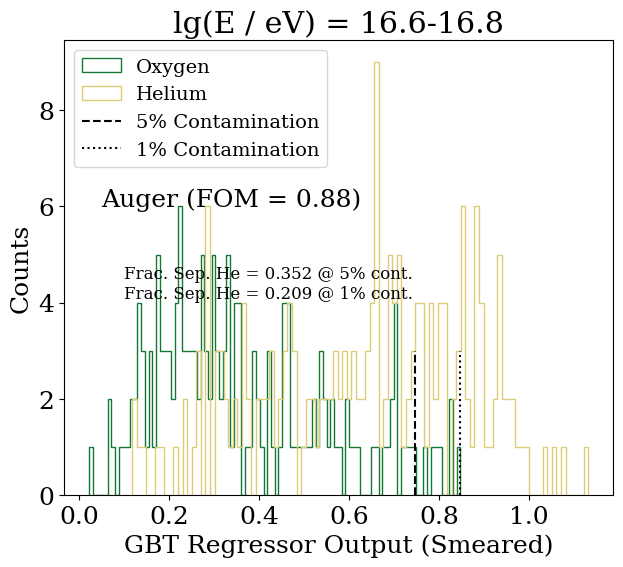

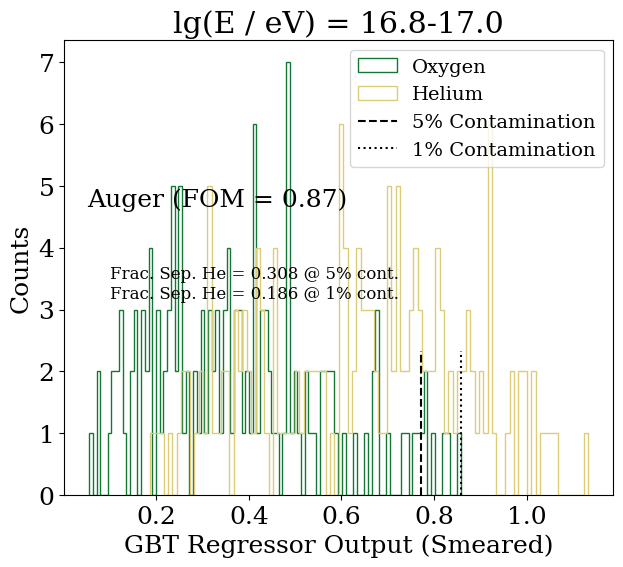

...

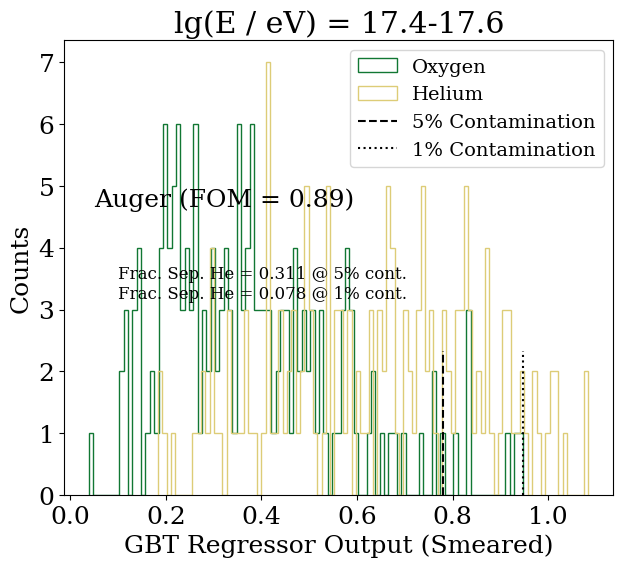

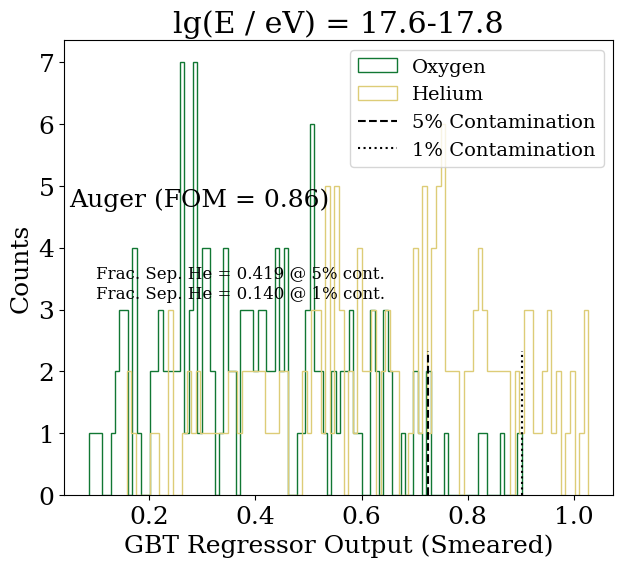

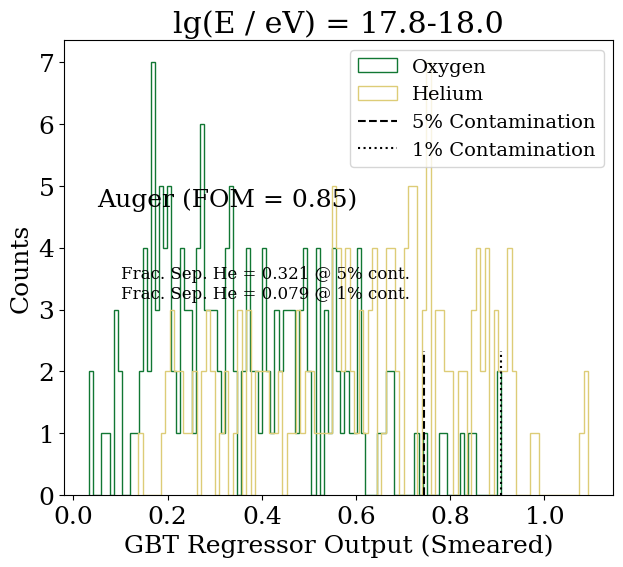

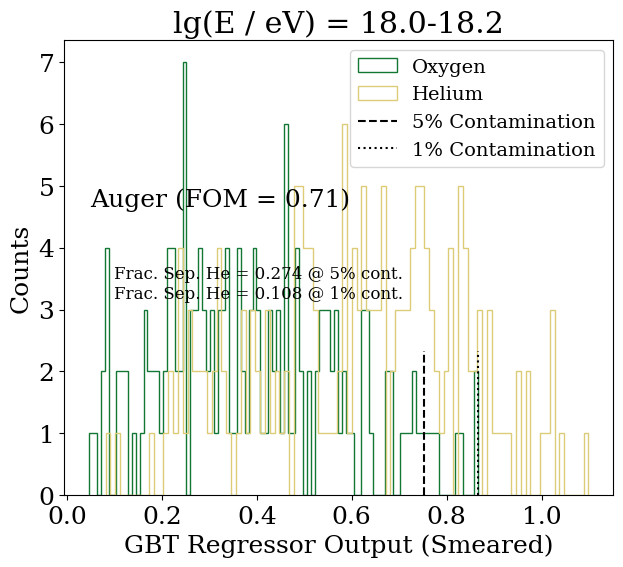

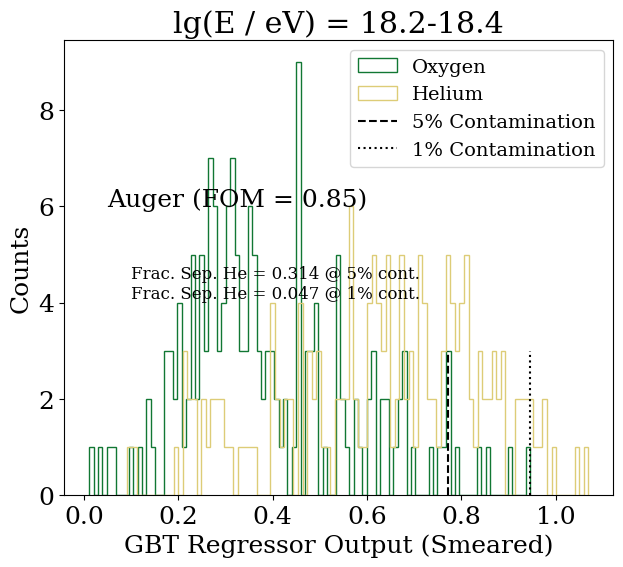



lgE Bin (Center),   FOM,                5% Contamination,   1% Contamination,   # Events
16.1                 0.87                 0.431                0.038                314                 
16.3                 0.92                 0.424                0.063                313                 
16.5                 0.76                 0.301                0.192                294                 
16.7                 0.88                 0.352                0.209                362                 
16.9                 0.87                 0.308                0.186                318                 
17.1                 0.68                 0.260                0.087                340                 
17.3                 0.87                 0.360                0.084                374                 
17.5                 0.89                 0.311                0.078                339                 
17.7                 0.86                 0.419                0.140 

In [ ]:
auger_HeO_FOM_smear, auger_HeO_5per_smear, auger_HeO_1per_smear, auger_HeO_numEvents_smear = PerformGBTAnalysis("Auger", lgEBinEdges, pFe=False, HeO=True, pHe=False, smear=True, verbose=False)
PrintGBTResults(lgEBinEdges, auger_HeO_FOM_smear, auger_HeO_5per_smear, auger_HeO_1per_smear, auger_HeO_numEvents_smear)

# Auger (p He Separation)

<ipython-input-35-322124611bc6>:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfCuts.ParticleID[dfCuts.ParticleID == 14] = 1




Model trained to separate Proton from Helium.
Training the model...
The scores of the GBT Regressor: 0.2691 (training set), 0.0637 (testing set)
(model trained on exact knowledge data but tested on smeared data)
Calculating model feature importances...
Observable: nMu800m              Importance: 0.458
Observable: Xmax                 Importance: 0.253
Observable: R_eMu800m            Importance: 0.184
Observable: L                    Importance: 0.05
Observable: R                    Importance: 0.03
Observable: nEM_Obslev           Importance: 0.024


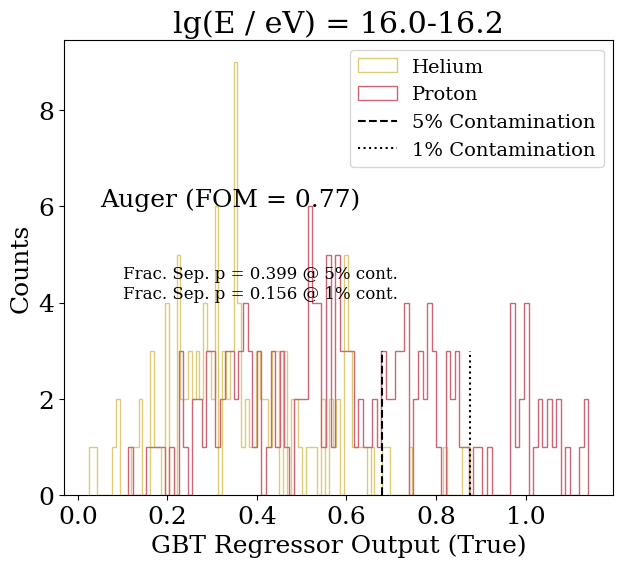

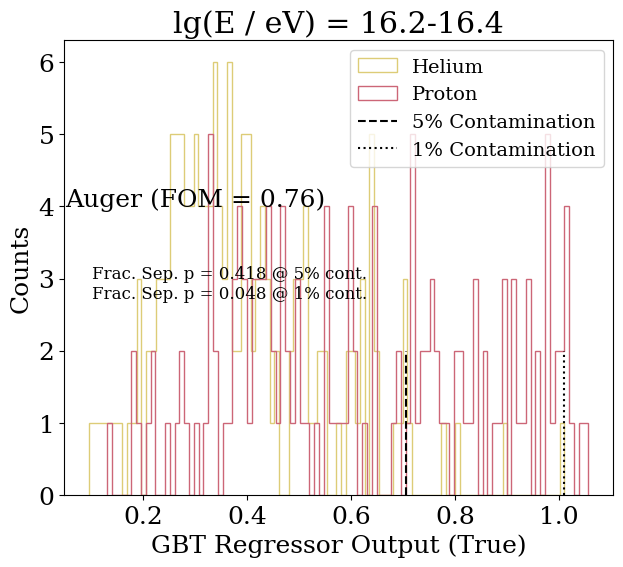

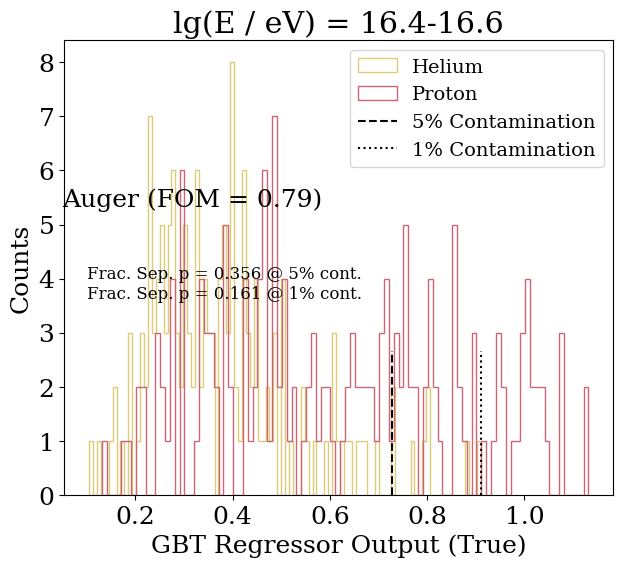

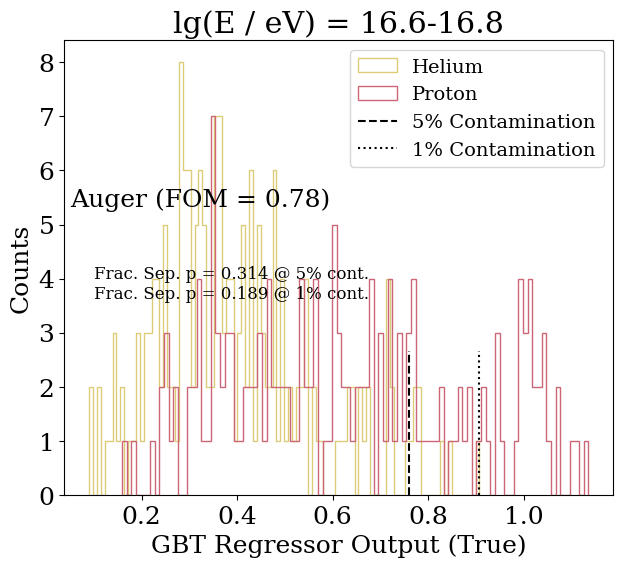

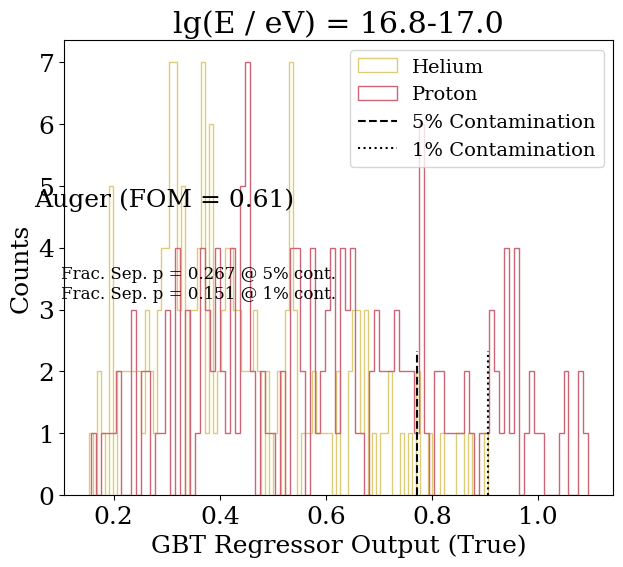

...

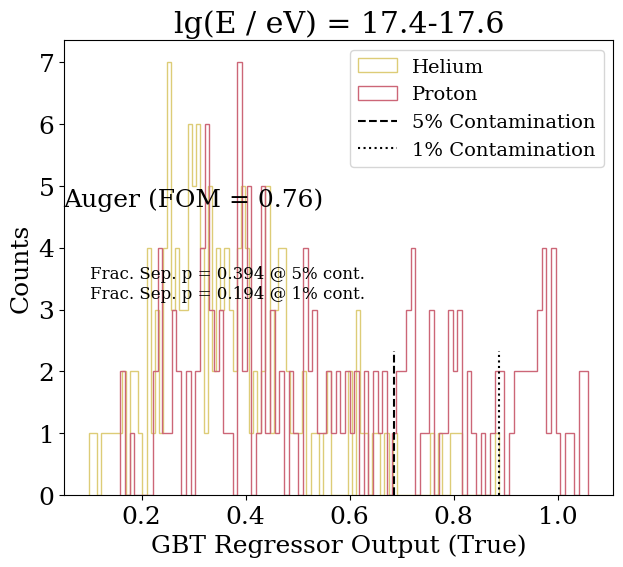

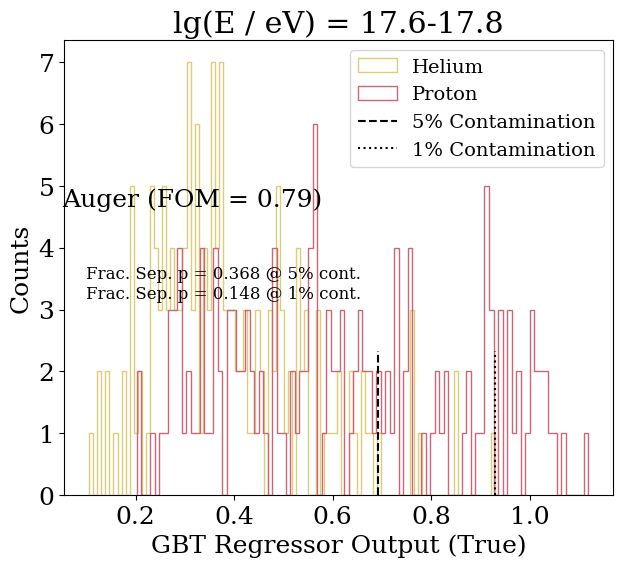

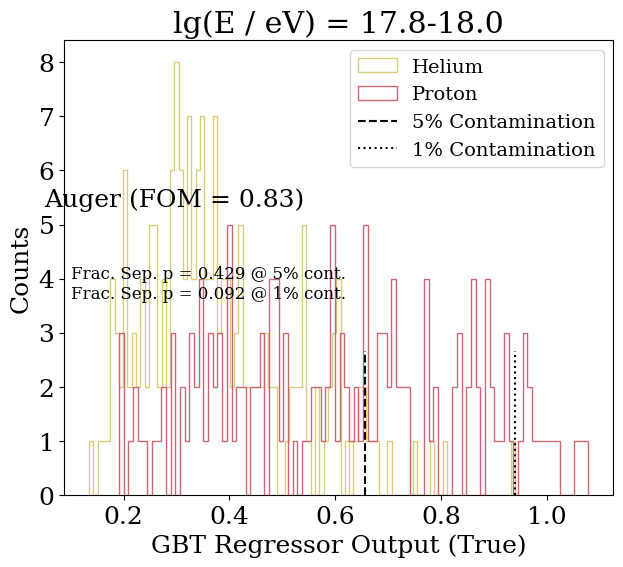

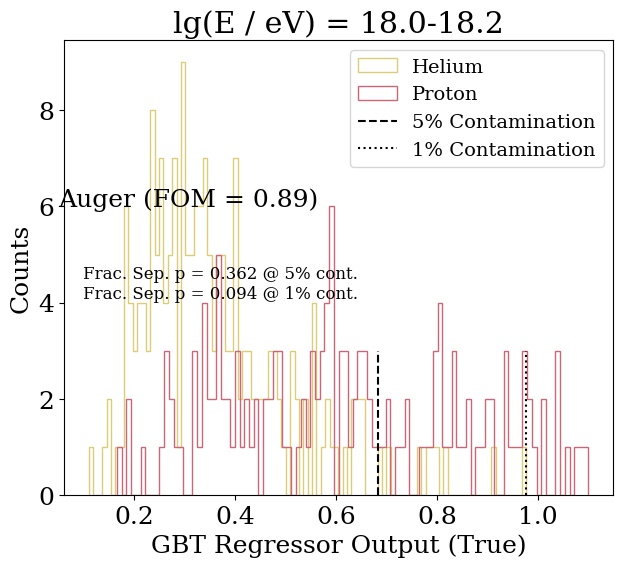

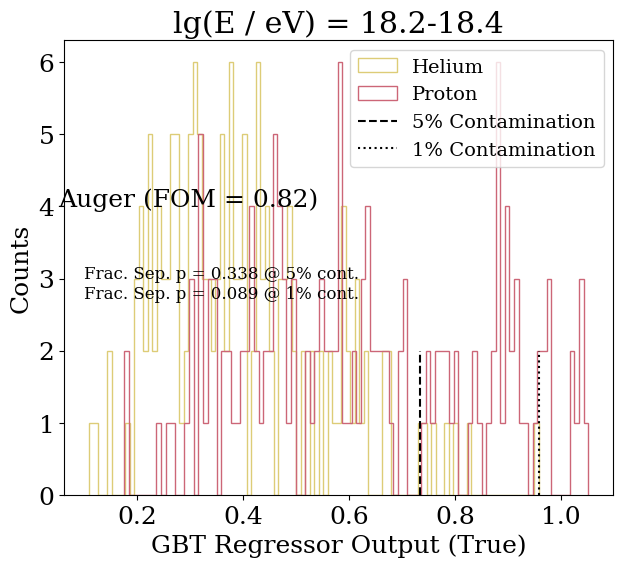



lgE Bin (Center),   FOM,                5% Contamination,   1% Contamination,   # Events
16.1                 0.77                 0.399                0.156                302                 
16.3                 0.76                 0.418                0.048                303                 
16.5                 0.79                 0.356                0.161                329                 
16.7                 0.78                 0.314                0.189                364                 
16.9                 0.61                 0.267                0.151                344                 
17.1                 0.82                 0.340                0.040                315                 
17.3                 0.82                 0.389                0.250                360                 
17.5                 0.76                 0.394                0.194                322                 
17.7                 0.79                 0.368                0.148 

In [ ]:
auger_pHe_FOM_true, auger_pHe_5per_true, auger_pHe_1per_true, auger_pHe_numEvents_true = PerformGBTAnalysis("Auger", lgEBinEdges, pFe=False, HeO=False, pHe=True, smear=False, verbose=False)
PrintGBTResults(lgEBinEdges, auger_pHe_FOM_true, auger_pHe_5per_true, auger_pHe_1per_true, auger_pHe_numEvents_true)

<ipython-input-35-322124611bc6>:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfCuts.ParticleID[dfCuts.ParticleID == 14] = 1




Model trained to separate Proton from Helium.
Training the GBDT on smeared data to simulate detector resolutions...
Training the model...
The scores of the GBT Regressor: 0.1806 (training set), 0.1447 (testing set)
(model trained and tested on smeared data)
Calculating model feature importances...
Observable: Xmax                 Importance: 0.396
Observable: nMu800m              Importance: 0.333
Observable: L                    Importance: 0.147
Observable: R_eMu800m            Importance: 0.084
Observable: R                    Importance: 0.02
Observable: nEM_Obslev           Importance: 0.019




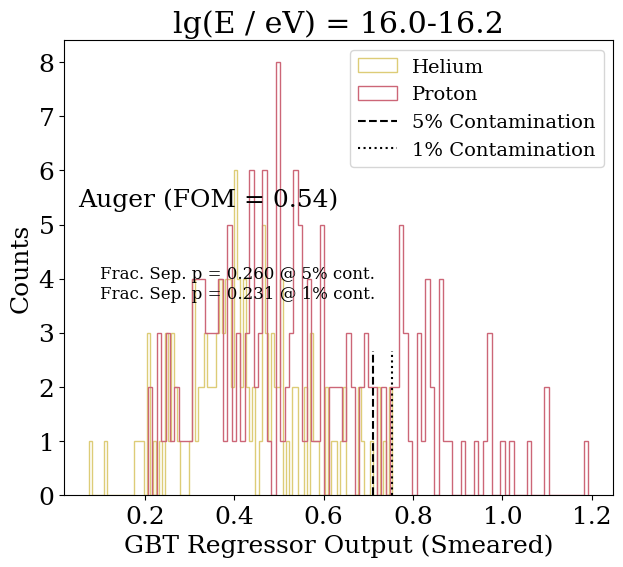

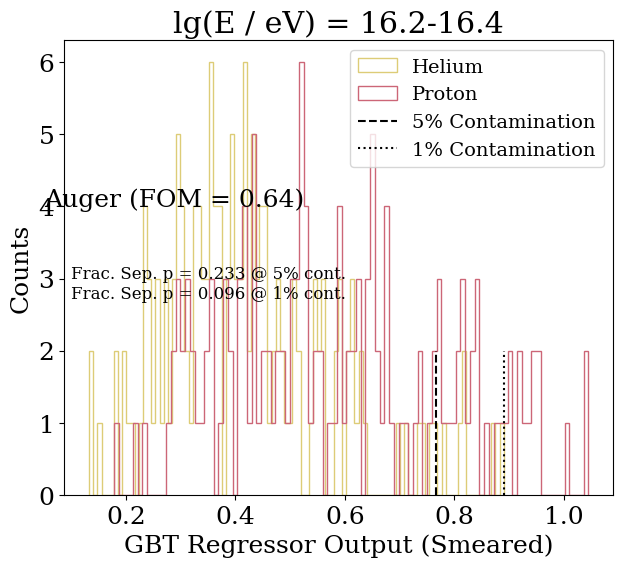

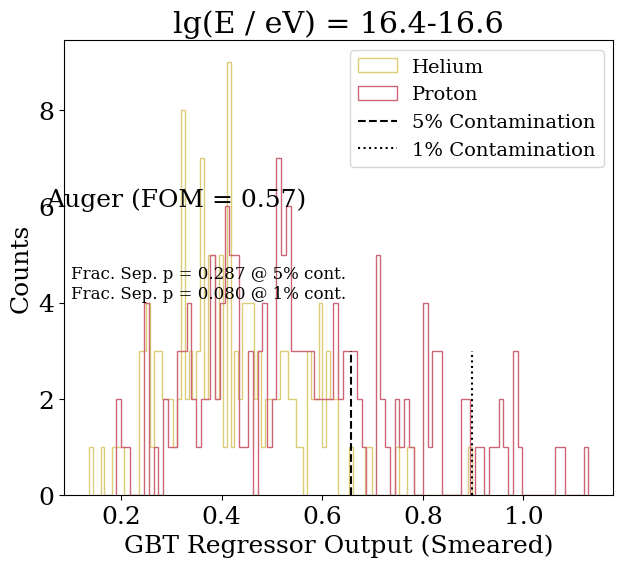

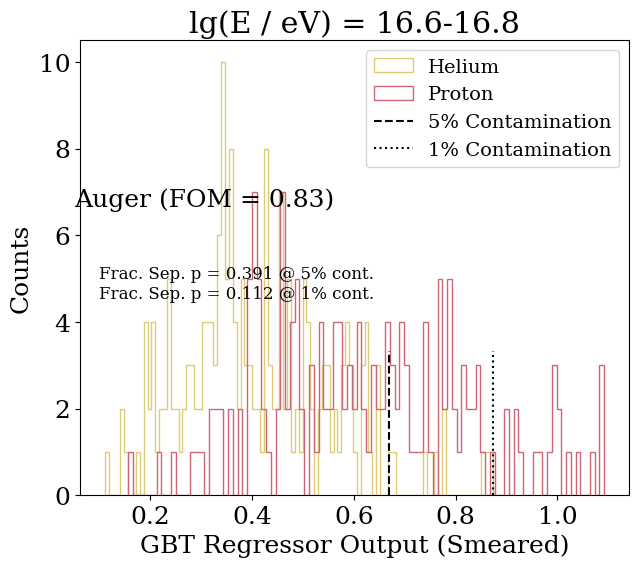

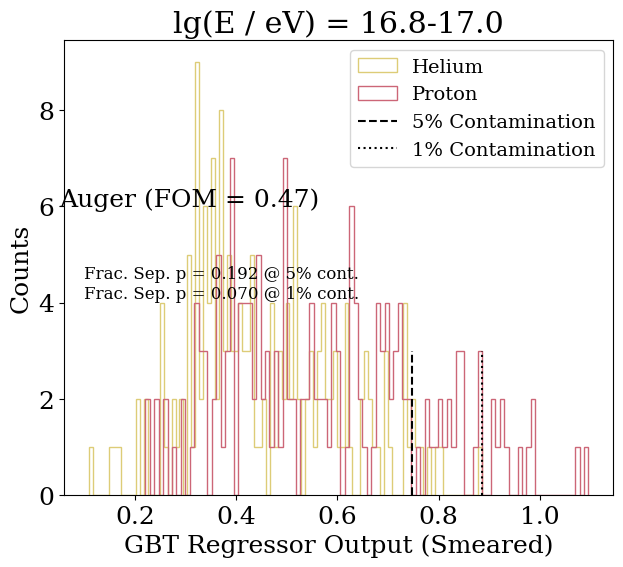

...

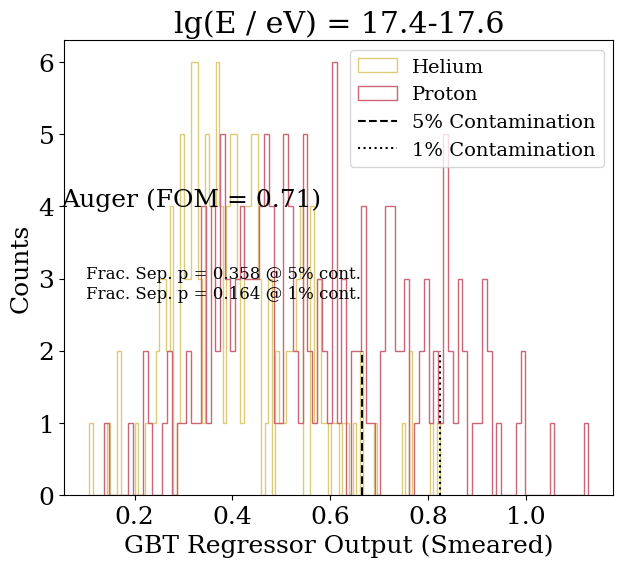

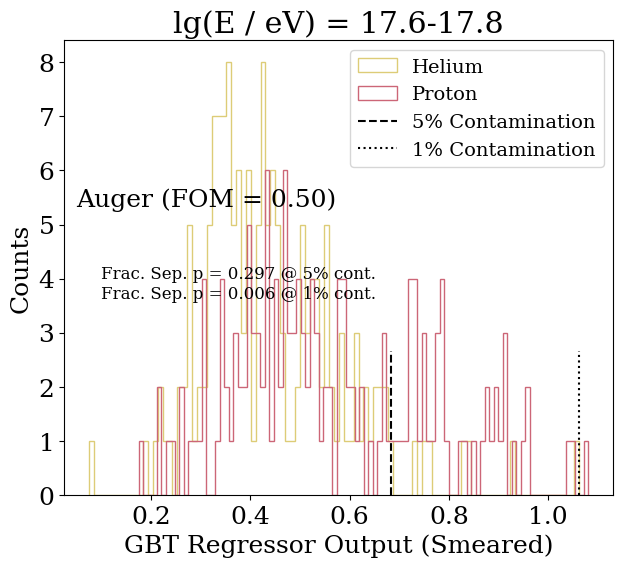

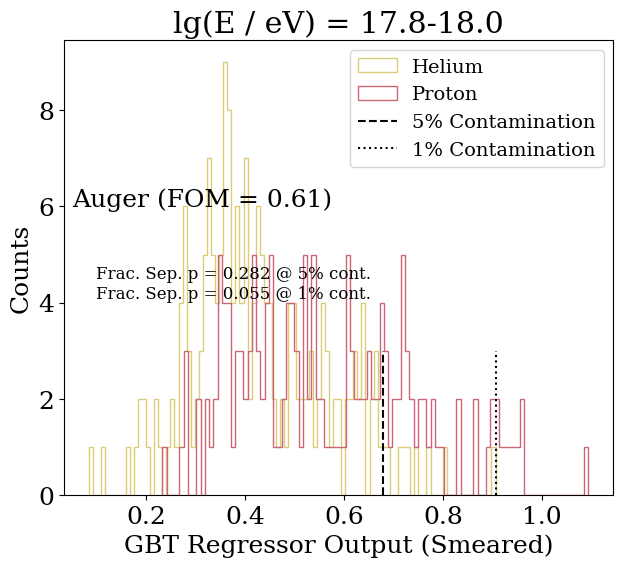

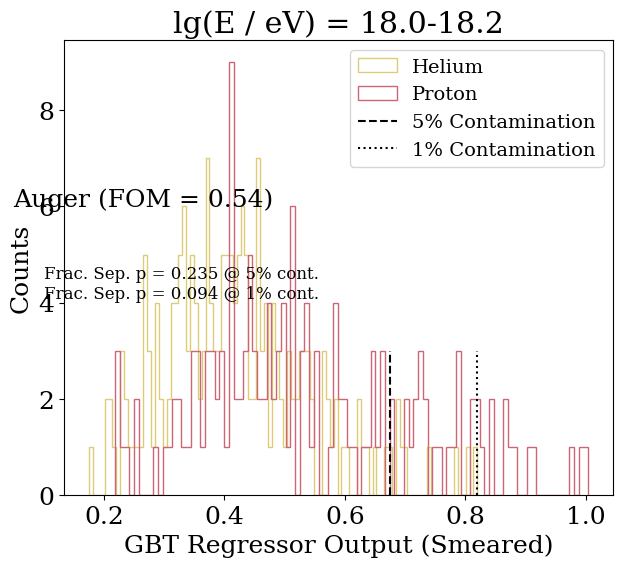

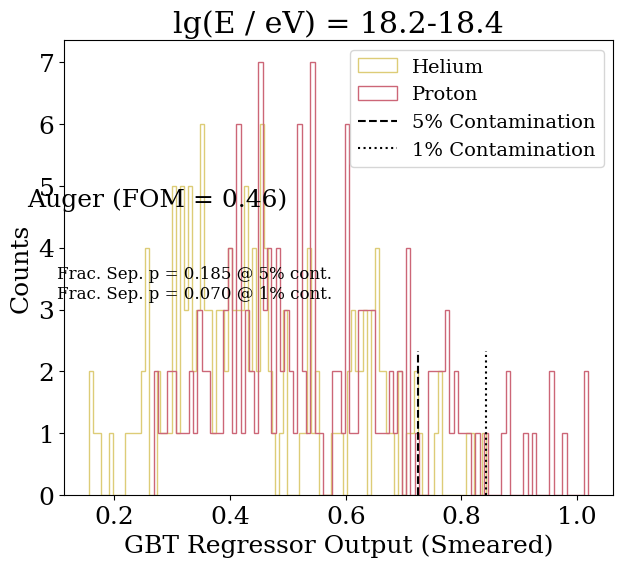



lgE Bin (Center),   FOM,                5% Contamination,   1% Contamination,   # Events
16.1                 0.54                 0.260                0.231                302                 
16.3                 0.64                 0.233                0.096                303                 
16.5                 0.57                 0.287                0.080                329                 
16.7                 0.83                 0.391                0.112                364                 
16.9                 0.47                 0.192                0.070                344                 
17.1                 0.62                 0.273                0.067                315                 
17.3                 0.51                 0.283                0.006                360                 
17.5                 0.71                 0.358                0.164                322                 
17.7                 0.50                 0.297                0.006 

In [ ]:
auger_pHe_FOM_smear, auger_pHe_5per_smear, auger_pHe_1per_smear, auger_pHe_numEvents_smear = PerformGBTAnalysis("Auger", lgEBinEdges, pFe=False, HeO=False, pHe=True, smear=True, verbose=False)
PrintGBTResults(lgEBinEdges, auger_pHe_FOM_smear, auger_pHe_5per_smear, auger_pHe_1per_smear, auger_pHe_numEvents_smear)